In [ ]:
import os
os.environ['KAGGLE_USERNAME'] = "summarization"
os.environ['KAGGLE_KEY'] = "acbca5d678fa7f7fdd441a05ee1ae4ad"

In [ ]:
!kaggle competitions download -c ga-customer-revenue-prediction

100% 1.11G/1.11G [00:14<00:00, 68.8MB/s]
100% 1.11G/1.11G [00:14<00:00, 82.4MB/s]
 79% 45.0M/56.8M [00:00<00:00, 65.0MB/s]
100% 56.8M/56.8M [00:00<00:00, 105MB/s] 
 99% 330M/333M [00:03<00:00, 129MB/s]
100% 333M/333M [00:03<00:00, 107MB/s]
  0% 0.00/5.23M [00:00<?, ?B/s]
100% 5.23M/5.23M [00:00<00:00, 48.0MB/s]
100% 61.0M/61.1M [00:00<00:00, 58.7MB/s]
100% 61.1M/61.1M [00:00<00:00, 74.0MB/s]
  0% 0.00/2.55M [00:00<?, ?B/s]
100% 2.55M/2.55M [00:00<00:00, 173MB/s]


In [ ]:
# !unzip "/content/train_v2.csv.zip"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Problem Statement

# In every business it was proven about 80–20 rule., this rule tells us 80% of our revenue will be generated by only 
# 20% of our potential customers. So our goal is to predict the revenue that is going to be generated by those potential 
# customers in the near feature. So that marketing teams will invest appropriate money on promotional strategies to 
# attract potential customers.

# In simple words we are given with the users past data and transactions (when they logged into G-store)., 
# so by using this data we need to predict the future revenue will be created by those customers.
# So google provided Merchandise customer dataset and no.of transactions per customer. 
# We will build a predictive model using G-store data set to predict the total revenue per customer that helps in 
# better use of marketing budget and we will also interpret the most impacting element on the total revenue prediction 
# using different models.


# Data Fields

# fullVisitorId- A unique identifier for each user of the Google Merchandise Store.
# channelGrouping - The channel via which the user came to the Store.
# date - The date on which the user visited the Store.
# device - The specifications for the device used to access the Store.
# geoNetwork - This section contains information about the geography of the user.
# sessionId - A unique identifier for this visit to the store.
# socialEngagementType - Engagement type, either "Socially Engaged" or "Not Socially Engaged".
# totals - This section contains aggregate values across the session.
# trafficSource - This section contains information about the Traffic Source from which the session originated.
# visitId - An identifier for this session. This is part of the value usually stored as the _utmb cookie. 
# This is only unique to the user. For a completely unique ID, we should use a combination of fullVisitorId and visitId.
# visitNumber - The session number for this user. If this is the first session, then this is set to 1.
# visitStartTime - The timestamp (expressed as POSIX time).

In [ ]:
# DATA LOADING AND PREPROCESSING

In [ ]:

# Reading training file

import pandas as pd
data = pd.read_csv('train_v2.csv.zip')
data.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,channelGrouping,customDimensions,date,device,fullVisitorId,geoNetwork,hits,socialEngagementType,totals,trafficSource,visitId,visitNumber,visitStartTime
0,Organic Search,"[{'index': '4', 'value': 'EMEA'}]",20171016,"{""browser"": ""Firefox"", ""browserVersion"": ""not ...",3162355547410993243,"{""continent"": ""Europe"", ""subContinent"": ""Weste...","[{'hitNumber': '1', 'time': '0', 'hour': '17',...",Not Socially Engaged,"{""visits"": ""1"", ""hits"": ""1"", ""pageviews"": ""1"",...","{""campaign"": ""(not set)"", ""source"": ""google"", ...",1508198450,1,1508198450
1,Referral,"[{'index': '4', 'value': 'North America'}]",20171016,"{""browser"": ""Chrome"", ""browserVersion"": ""not a...",8934116514970143966,"{""continent"": ""Americas"", ""subContinent"": ""Nor...","[{'hitNumber': '1', 'time': '0', 'hour': '10',...",Not Socially Engaged,"{""visits"": ""1"", ""hits"": ""2"", ""pageviews"": ""2"",...","{""referralPath"": ""/a/google.com/transportation...",1508176307,6,1508176307
2,Direct,"[{'index': '4', 'value': 'North America'}]",20171016,"{""browser"": ""Chrome"", ""browserVersion"": ""not a...",7992466427990357681,"{""continent"": ""Americas"", ""subContinent"": ""Nor...","[{'hitNumber': '1', 'time': '0', 'hour': '17',...",Not Socially Engaged,"{""visits"": ""1"", ""hits"": ""2"", ""pageviews"": ""2"",...","{""campaign"": ""(not set)"", ""source"": ""(direct)""...",1508201613,1,1508201613
3,Organic Search,"[{'index': '4', 'value': 'EMEA'}]",20171016,"{""browser"": ""Chrome"", ""browserVersion"": ""not a...",9075655783635761930,"{""continent"": ""Asia"", ""subContinent"": ""Western...","[{'hitNumber': '1', 'time': '0', 'hour': '9', ...",Not Socially Engaged,"{""visits"": ""1"", ""hits"": ""2"", ""pageviews"": ""2"",...","{""campaign"": ""(not set)"", ""source"": ""google"", ...",1508169851,1,1508169851
4,Organic Search,"[{'index': '4', 'value': 'Central America'}]",20171016,"{""browser"": ""Chrome"", ""browserVersion"": ""not a...",6960673291025684308,"{""continent"": ""Americas"", ""subContinent"": ""Cen...","[{'hitNumber': '1', 'time': '0', 'hour': '14',...",Not Socially Engaged,"{""visits"": ""1"", ""hits"": ""2"", ""pageviews"": ""2"",...","{""campaign"": ""(not set)"", ""source"": ""google"", ...",1508190552,1,1508190552


In [ ]:
data.columns

Index(['channelGrouping', 'customDimensions', 'date', 'device',
       'fullVisitorId', 'geoNetwork', 'hits', 'socialEngagementType', 'totals',
       'trafficSource', 'visitId', 'visitNumber', 'visitStartTime'],
      dtype='object')

In [ ]:
data.shape

(1708337, 13)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 13 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   channelGrouping       object
 1   customDimensions      object
 2   date                  int64 
 3   device                object
 4   fullVisitorId         object
 5   geoNetwork            object
 6   hits                  object
 7   socialEngagementType  object
 8   totals                object
 9   trafficSource         object
 10  visitId               int64 
 11  visitNumber           int64 
 12  visitStartTime        int64 
dtypes: int64(4), object(9)
memory usage: 169.4+ MB


In [ ]:
train= data.copy()

In [ ]:
#Import Section
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Import matplotlib & seaborn for visualisation
import json
from pandas.io.json import json_normalize
import seaborn as sns 
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
import numpy as np
init_notebook_mode(connected=True)
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as st
import missingno as msno

In [ ]:
col1 =  pd.json_normalize(data.device.apply(json.loads))
col1.columns = [f"{'device'}.{subcolumn}" for subcolumn in col1.columns]
col1 = pd.DataFrame(col1)
col1


,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory
0,Firefox,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop
1,Chrome,not available in demo dataset,not available in demo dataset,Chrome OS,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop
2,Chrome,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile
3,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop
4,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708332,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop
1708333,Chrome,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile
1708334,Android Webview,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile
1708335,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop


In [ ]:
col1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 16 columns):
 #   Column                            Dtype 
---  ------                            ----- 
 0   device.browser                    object
 1   device.browserVersion             object
 2   device.browserSize                object
 3   device.operatingSystem            object
 4   device.operatingSystemVersion     object
 5   device.isMobile                   bool  
 6   device.mobileDeviceBranding       object
 7   device.mobileDeviceModel          object
 8   device.mobileInputSelector        object
 9   device.mobileDeviceInfo           object
 10  device.mobileDeviceMarketingName  object
 11  device.flashVersion               object
 12  device.language                   object
 13  device.screenColors               object
 14  device.screenResolution           object
 15  device.deviceCategory             object
dtypes: bool(1), object(15)
memory usage: 197.1+ MB


In [ ]:
# device - RECORD	- This section contains information about the user devices.

# device.browser - 	STRING	- The browser used (e.g., "Chrome" or "Firefox").

# device.browserVersion	- STRING -	The version of the browser used.

# device.browserSize -	STRING	The viewport size of users' browsers. This captures the initial dimensions of the 
# viewport in pixels and is formatted as width x height, for example, 1920x960.

# device.operatingSystem - STRING	- The operating system of the device (e.g., "Android" or "Windows").

# device.operatingSystemVersion	- STRING	- The version of the operating system.

# device.isMobile  - BOOLEAN -	If the user is on a mobile device, this value is true, otherwise false. 

# device.mobileDeviceBranding	- STRING	- The brand or manufacturer of the device.

# device.mobileDeviceModel	- STRING	- The mobile device model.

# device.mobileInputSelector - STRING	- Selector (e.g., touchscreen, joystick, clickwheel, stylus) used on the mobile 
# device.

# device.mobileDeviceInfo	- STRING -	The branding, model, and marketing name used to identify the mobile device.

# device.mobileDeviceMarketingName -	STRING -	The marketing name used for the mobile device.

# device.flashVersion	- STRING -	The version of the Adobe Flash plugin that is installed on the browser.

# device.language	- STRING -	The language the device is set to use. Expressed as the IETF language code.

# device.screenColors	- STRING -	Number of colors supported by the display, expressed as the bit-depth 
# (e.g., "8-bit", "24-bit", etc.).

# device.screenResolution	- STRING -	The resolution of the device's screen, expressed in pixel width x height
# (e.g., "800x600").

# device.deviceCategory	- STRING -	The type of device (Mobile, Tablet, Desktop).


In [ ]:
col2 =  pd.json_normalize(data.geoNetwork.apply(json.loads))
col2.columns = [f"{'geonetwork'}.{subcolumn}" for subcolumn in col2.columns]
col2 = pd.DataFrame(col2)
col2


,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.cityId,geonetwork.networkDomain,geonetwork.latitude,geonetwork.longitude,geonetwork.networkLocation
0,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset
1,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset
2,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,not available in demo dataset,not available in demo dataset,not available in demo dataset
3,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset
4,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,not available in demo dataset,not available in demo dataset,not available in demo dataset
...,...,...,...,...,...,...,...,...,...,...,...
1708332,Americas,Caribbean,Puerto Rico,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,prtc.net,not available in demo dataset,not available in demo dataset,not available in demo dataset
1708333,Asia,Southern Asia,Sri Lanka,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset
1708334,Asia,Eastern Asia,South Korea,Seoul,(not set),Seoul,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset
1708335,Asia,Southeast Asia,Indonesia,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset


In [ ]:
col2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 11 columns):
 #   Column                      Dtype 
---  ------                      ----- 
 0   geonetwork.continent        object
 1   geonetwork.subContinent     object
 2   geonetwork.country          object
 3   geonetwork.region           object
 4   geonetwork.metro            object
 5   geonetwork.city             object
 6   geonetwork.cityId           object
 7   geonetwork.networkDomain    object
 8   geonetwork.latitude         object
 9   geonetwork.longitude        object
 10  geonetwork.networkLocation  object
dtypes: object(11)
memory usage: 143.4+ MB


In [ ]:
# geoNetwork - RECORD - This section contains information about the geography of the user.

# geoNetwork.continent -STRING -	The continent from which sessions originated, based on IP address.

# geoNetwork.subContinent	- STRING -	The sub-continent from which sessions originated, based on IP address of the 
# visitor.

# geoNetwork.country- STRING -	The country from which sessions originated, based on IP address.

# geoNetwork.region	- STRING -	The region from which sessions originate, derived from IP addresses. 
# In the U.S., a region is a state, such as New York.

# geoNetwork.metro	- STRING	- The Designated Market Area (DMA) from which sessions originate.

# geoNetwork.city	- STRING -	Users' city, derived from their IP addresses or Geographical IDs.

# geoNetwork.cityId	-STRING	- Users' city ID, derived from their IP addresses or Geographical IDs. 

# geoNetwork.networkDomain - STRING	- The domain name of user's ISP, derived from the domain name registered to the 
# ISP's IP address.

# geoNetwork.latitude	- STRING	- The approximate latitude of users' city, derived from their IP addresses or 
# Geographical IDs. Locations north of the equator have positive latitudes and locations south of the equator have 
# negative latitudes.

# geoNetwork.longitude -	STRING -The approximate longitude of users' city, derived from their IP addresses or 
# Geographical IDs. Locations east of the prime meridian have positive longitudes and locations west of the prime 
# meridian have negative longitudes.

# geoNetwork.networkLocation	- STRING - The names of the service providers used to reach the property. 
# For example, if most users of the website come via the major cable internet service providers, its value will be 
# these service providers' names.


In [ ]:
col3 =  pd.json_normalize(data.totals.apply(json.loads))
col3.columns = [f"{'totals'}.{subcolumn}" for subcolumn in col3.columns]
col3 = pd.DataFrame(col3)
col3


,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,totals.totalTransactionRevenue
0,1,1,1,1,1,1,NaN,NaN,NaN,NaN
1,1,2,2,NaN,NaN,2,28,NaN,NaN,NaN
2,1,2,2,NaN,1,1,38,NaN,NaN,NaN
3,1,2,2,NaN,1,1,1,NaN,NaN,NaN
4,1,2,2,NaN,1,1,52,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1708332,1,17,15,NaN,1,NaN,626,NaN,NaN,NaN
1708333,1,18,13,NaN,1,NaN,258,NaN,NaN,NaN
1708334,1,24,21,NaN,1,NaN,991,NaN,NaN,NaN
1708335,1,24,22,NaN,1,NaN,1274,NaN,NaN,NaN


In [ ]:
col3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 10 columns):
 #   Column                          Dtype 
---  ------                          ----- 
 0   totals.visits                   object
 1   totals.hits                     object
 2   totals.pageviews                object
 3   totals.bounces                  object
 4   totals.newVisits                object
 5   totals.sessionQualityDim        object
 6   totals.timeOnSite               object
 7   totals.transactions             object
 8   totals.transactionRevenue       object
 9   totals.totalTransactionRevenue  object
dtypes: object(10)
memory usage: 130.3+ MB


In [ ]:
# totals -	RECORD -	This section contains aggregate values across the session.

# totals.visits -	The number of sessions (for convenience). This value is 1 for sessions with interaction events. 
# The value is null if there are no interaction events in the session.

# totals.hits	- Total number of hits within the session.

# totals.pageviews	-	Total number of pageviews within the session.

# totals.bounces	-	Total bounces (for convenience). For a bounced session, the value is 1, otherwise it is null.

# totals.newVisits	INTEGER	Total number of new users in session (for convenience). If this is the first visit, 
# this value is 1, otherwise it is null.

# totals.sessionQualityDim	- An estimate of how close a particular session was to transacting, ranging from 1 to 100, 
# calculated for each session. A value closer to 1 indicates a low session quality, or far from transacting, while a 
# value closer to 100 indicates a high session quality, or very close to transacting. A value of 0 indicates that 
# Session Quality is not calculated for the selected time range.

# totals.timeOnSite	- Total time of the session expressed in seconds.

# totals.transactions	-	Total number of ecommerce transactions within the session.

# totals.transactionRevenue	- This field is deprecated. Use "totals.totalTransactionRevenue" instead (see above).

# totals.totalTransactionRevenue - Total transaction revenue, expressed as the value passed to Analytics multiplied 
# by 10^6 (e.g., 2.40 would be given as 2400000).



In [ ]:
col4 =  pd.json_normalize(data.trafficSource.apply(json.loads))
col4.columns = [f"{'trafficSource'}.{subcolumn}" for subcolumn in col4.columns]
col4 = pd.DataFrame(col4)
col4

,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.referralPath,trafficSource.isTrueDirect,trafficSource.adContent,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.campaignCode
0,(not set),google,organic,water bottle,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,(not set),sites.google.com,referral,NaN,not available in demo dataset,/a/google.com/transportation/mtv-services/bike...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,(not set),(direct),(none),NaN,not available in demo dataset,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708332,(not set),youtube.com,referral,NaN,not available in demo dataset,/yt/about/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1708333,(not set),youtube.com,referral,NaN,not available in demo dataset,/yt/about/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1708334,(not set),youtube.com,referral,NaN,not available in demo dataset,/yt/about/ko/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1708335,(not set),facebook.com,referral,NaN,not available in demo dataset,/l.php,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
col4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 14 columns):
 #   Column                                             Dtype 
---  ------                                             ----- 
 0   trafficSource.campaign                             object
 1   trafficSource.source                               object
 2   trafficSource.medium                               object
 3   trafficSource.keyword                              object
 4   trafficSource.adwordsClickInfo.criteriaParameters  object
 5   trafficSource.referralPath                         object
 6   trafficSource.isTrueDirect                         object
 7   trafficSource.adContent                            object
 8   trafficSource.adwordsClickInfo.page                object
 9   trafficSource.adwordsClickInfo.slot                object
 10  trafficSource.adwordsClickInfo.gclId               object
 11  trafficSource.adwordsClickInfo.adNetworkType       object
 12  

In [ ]:
2-+# trafficSource	- RECORD -This section contains information about the Traffic Source from which the session originated.

# trafficSource.campaign	-	The campaign value. Usually set by the utm_campaign URL parameter.

# trafficSource.source	- The source of the traffic source. Could be the name of the search engine, the referring 
# hostname, or a value of the utm_source URL parameter

# trafficSource.medium -The medium of the traffic source. Could be "organic", "cpc", "referral", or the value of the 
# utm_medium URL parameter.

# trafficSource.keyword	- The keyword of the traffic source, usually set when the trafficSource.medium is "organic" or "cpc". Can be set by the utm_term URL parameter.

# trafficSource.adwordsClickInfo.criteriaParameters	-	Descriptive string for the targeting criterion.

# trafficSource.referralPath - 	If trafficSource.medium is "referral", then this is set to the path of the referrer. 
# (The host name of the referrer is in trafficSource.source.)

# trafficSource.isTrueDirect -True if the source of the session was Direct (meaning the user typed the name of your 
# website URL into the browser or came to your site via a bookmark), This field will also be true if 2 successive but 
# distinct sessions have exactly the same campaign details. Otherwise NULL.

# trafficSource.adContent	- The ad content of the traffic source. Can be set by the utm_content URL parameter.

# trafficSource.adwordsClickInfo.page	-	Page number in search results where the ad was shown.

# trafficSource.adwordsClickInfo.slot	- 	Position of the Ad. Takes one of the following values:{“RHS", "Top"}

# trafficSource.adwordsClickInfo.gclId	-	The Google Click ID.

# trafficSource.adwordsClickInfo.adNetworkType		Network Type. Takes one of the following values: 
# {“Google Search", "Content", "Search partners", "Ad Exchange", "Yahoo Japan Search", "Yahoo Japan AFS", “unknown”}

# trafficSource.adwordsClickInfo.isVideoAd	- True if it is a Trueview video ad.

# trafficSource.campaignCode -	Value of the utm_id campaign tracking parameter, used for manual campaign tracking.


In [ ]:
# Dropping original columns

data = data.drop(['device', 'geoNetwork','totals', 'trafficSource'], axis=1).reset_index(drop=True)

In [ ]:
data.shape

(1708337, 9)

In [ ]:
data.columns

Index(['channelGrouping', 'customDimensions', 'date', 'fullVisitorId', 'hits',
       'socialEngagementType', 'visitId', 'visitNumber', 'visitStartTime'],
      dtype='object')

In [ ]:
df = pd.concat([data,col1,col2,col3,col4],axis=1)
df.head()

,channelGrouping,customDimensions,date,fullVisitorId,hits,socialEngagementType,visitId,visitNumber,visitStartTime,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.cityId,geonetwork.networkDomain,geonetwork.latitude,geonetwork.longitude,geonetwork.networkLocation,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,totals.totalTransactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.referralPath,trafficSource.isTrueDirect,trafficSource.adContent,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.campaignCode
0,Organic Search,"[{'index': '4', 'value': 'EMEA'}]",20171016,3162355547410993243,"[{'hitNumber': '1', 'time': '0', 'hour': '17',...",Not Socially Engaged,1508198450,1,1508198450,Firefox,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1,1,1,1,NaN,NaN,NaN,NaN,(not set),google,organic,water bottle,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Referral,"[{'index': '4', 'value': 'North America'}]",20171016,8934116514970143966,"[{'hitNumber': '1', 'time': '0', 'hour': '10',...",Not Socially Engaged,1508176307,6,1508176307,Chrome,not available in demo dataset,not available in demo dataset,Chrome OS,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,2,2,NaN,NaN,2,28,NaN,NaN,NaN,(not set),sites.google.com,referral,NaN,not available in demo dataset,/a/google.com/transportation/mtv-services/bike...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Direct,"[{'index': '4', 'value': 'North America'}]",20171016,7992466427990357681,"[{'hitNumber': '1', 'time': '0', 'hour': '17',...",Not Socially Engaged,1508201613,1,1508201613,Chrome,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,windj

In [ ]:
df.shape

(1708337, 60)

In [ ]:
df.columns

Index(['channelGrouping', 'customDimensions', 'date', 'fullVisitorId', 'hits',
       'socialEngagementType', 'visitId', 'visitNumber', 'visitStartTime',
       'device.browser', 'device.browserVersion', 'device.browserSize',
       'device.operatingSystem', 'device.operatingSystemVersion',
       'device.isMobile', 'device.mobileDeviceBranding',
       'device.mobileDeviceModel', 'device.mobileInputSelector',
       'device.mobileDeviceInfo', 'device.mobileDeviceMarketingName',
       'device.flashVersion', 'device.language', 'device.screenColors',
       'device.screenResolution', 'device.deviceCategory',
       'geonetwork.continent', 'geonetwork.subContinent', 'geonetwork.country',
       'geonetwork.region', 'geonetwork.metro', 'geonetwork.city',
       'geonetwork.cityId', 'geonetwork.networkDomain', 'geonetwork.latitude',
       'geonetwork.longitude', 'geonetwork.networkLocation', 'totals.visits',
       'totals.hits', 'totals.pageviews', 'totals.bounces', 'totals.newVisits',
 

In [ ]:
# if analyse the 'hits' feature it seems to be have very complex daata., this complex data won't add any value to our 
# target feature so we will drop this feature also.


df['hits'][0]


"[{'hitNumber': '1', 'time': '0', 'hour': '17', 'minute': '0', 'isInteraction': True, 'isEntrance': True, 'isExit': True, 'referer': 'https://www.google.co.uk/search?q=water+bottle&ie=utf-8&num=100&oe=utf-8&hl=en&gl=GB&uule=w+CAIQIFISCamRx0IRO1oCEXoliDJDoPjE&glp=1&gws_rd=cr&fg=1', 'page': {'pagePath': '/google+redesign/bags/water+bottles+and+tumblers', 'hostname': 'shop.googlemerchandisestore.com', 'pageTitle': 'Water Bottles & Tumblers | Drinkware | Google Merchandise Store', 'pagePathLevel1': '/google+redesign/', 'pagePathLevel2': '/bags/', 'pagePathLevel3': '/water+bottles+and+tumblers', 'pagePathLevel4': ''}, 'transaction': {'currencyCode': 'USD'}, 'item': {'currencyCode': 'USD'}, 'appInfo': {'screenName': 'shop.googlemerchandisestore.com/google+redesign/bags/water+bottles+and+tumblers', 'landingScreenName': 'shop.googlemerchandisestore.com/google+redesign/bags/water+bottles+and+tumblers', 'exitScreenName': 'shop.googlemerchandisestore.com/google+redesign/bags/water+bottles+and+tum

In [ ]:
# customDimensions: this feature also not seems to be very important. so we will drop this feature also


df['customDimensions'][0]

"[{'index': '4', 'value': 'EMEA'}]"

In [ ]:
# Removing unwanted columns

df.drop(['customDimensions','hits'],axis=1,inplace=True)
df.reset_index()

In [ ]:
df.head()

,channelGrouping,date,fullVisitorId,socialEngagementType,visitId,visitNumber,visitStartTime,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.cityId,geonetwork.networkDomain,geonetwork.latitude,geonetwork.longitude,geonetwork.networkLocation,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,totals.totalTransactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.referralPath,trafficSource.isTrueDirect,trafficSource.adContent,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.campaignCode
0,Organic Search,20171016,3162355547410993243,Not Socially Engaged,1508198450,1,1508198450,Firefox,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1,1,1,1,NaN,NaN,NaN,NaN,(not set),google,organic,water bottle,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Referral,20171016,8934116514970143966,Not Socially Engaged,1508176307,6,1508176307,Chrome,not available in demo dataset,not available in demo dataset,Chrome OS,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,2,2,NaN,NaN,2,28,NaN,NaN,NaN,(not set),sites.google.com,referral,NaN,not available in demo dataset,/a/google.com/transportation/mtv-services/bike...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Direct,20171016,7992466427990357681,Not Socially Engaged,1508201613,1,1508201613,Chrome,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,2,2,NaN,1,1,38,NaN,NaN,NaN,(not set),(direct),(none),NaN,not available in demo dataset,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Organic Search,20171016,9075655783635761930,Not Socially Engaged,150816

In [ ]:
df.shape

(1708337, 58)

In [ ]:
# saving the preprocessed data into file:

# storing data frames as csv files:
df.to_csv('preprocessed_train_df.csv')


In [ ]:
# reading from files

import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/preprocessed_train_df.csv',dtype={'fullVisitorId': 'str'},index_col=0)

In [ ]:
df.head()

,channelGrouping,date,fullVisitorId,socialEngagementType,visitId,visitNumber,visitStartTime,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.cityId,geonetwork.networkDomain,geonetwork.latitude,geonetwork.longitude,geonetwork.networkLocation,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,totals.totalTransactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.referralPath,trafficSource.isTrueDirect,trafficSource.adContent,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.campaignCode
0,Organic Search,20171016,3162355547410993243,Not Socially Engaged,1508198450,1,1508198450,Firefox,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,(not set),google,organic,water bottle,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Referral,20171016,8934116514970143966,Not Socially Engaged,1508176307,6,1508176307,Chrome,not available in demo dataset,not available in demo dataset,Chrome OS,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,not available in demo dataset,(not set),not available in demo dataset,not available in demo dataset,not available in demo dataset,1,2,2.0,NaN,NaN,2.0,28.0,NaN,NaN,NaN,(not set),sites.google.com,referral,NaN,not available in demo dataset,/a/google.com/transportation/mtv-services/bike...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Direct,20171016,7992466427990357681,Not Socially Engaged,1508201613,1,1508201613,Chrome,not available in demo dataset,not available in demo dataset,Android,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,2,2.0,NaN,1.0,1.0,38.0,NaN,NaN,NaN,(not set),(direct),(none),NaN,not available in demo dataset,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Organic Search,20171016,9075655783635761930,Not S

In [ ]:
df.shape

(1708337, 58)

In [ ]:
# DATA CLEANING

In [ ]:
# we will check how many unique values are present in each column of data:

df.nunique()

channelGrouping                                            8
date                                                     638
fullVisitorId                                        1331776
socialEngagementType                                       1
visitId                                              1665802
visitNumber                                              457
visitStartTime                                       1667423
device.browser                                           129
device.browserVersion                                      1
device.browserSize                                         1
device.operatingSystem                                    24
device.operatingSystemVersion                              1
device.isMobile                                            2
device.mobileDeviceBranding                                1
device.mobileDeviceModel                                   1
device.mobileInputSelector                                 1
device.mobileDeviceInfo 

In [ ]:
# observation: if the same unique value present in all rows of any given feature means no need to use those features. 
# since that feature value is constant across all records means it won't affect our final predicting variable.


In [ ]:
# so here we will drop those columns which will have unique value acorss all records or rows :

column_names = df.columns
unique_value_columns=[]
for column in column_names:
    count = df[column].nunique()
    if count==1:
        del df[column]
        unique_value_columns.append(column)

In [ ]:
# In the above code snippet we are checking for each column how many unique values are present. If count is one , 
# that means same value exists for that feature across the data-set. so that particular feature will not help us for any 
# ind of predictions. so we are dropping those columns.



In [ ]:
df.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'visitId', 'visitNumber',
       'visitStartTime', 'device.browser', 'device.operatingSystem',
       'device.isMobile', 'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'totals.hits', 'totals.pageviews', 'totals.sessionQualityDim',
       'totals.timeOnSite', 'totals.transactions', 'totals.transactionRevenue',
       'totals.totalTransactionRevenue', 'trafficSource.campaign',
       'trafficSource.source', 'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent',
       'trafficSource.adwordsClickInfo.page',
       'trafficSource.adwordsClickInfo.slot',
       'trafficSource.adwordsClickInfo.gclId',
       'trafficSource.adwordsClickInfo.adNetworkType'],
      dtype='object')

In [ ]:
df.shape

(1708337, 34)

In [ ]:
# Earlier we have 58 columns but after dropping constant value columns, we are left with only 34 columns for analysis

In [ ]:
# Missing Value Analysis

total = df.isnull().sum().sort_values(ascending = False)  #total missing values
percent = total/df.shape[0] * 100
missing_df = pd.concat([total,percent],axis=1, keys=['Total', 'Percent'])
missing_df

,Total,Percent
totals.transactionRevenue,1689823,98.916256
totals.totalTransactionRevenue,1689823,98.916256
totals.transactions,1689778,98.913622
trafficSource.adContent,1643600,96.210525
trafficSource.adwordsClickInfo.adNetworkType,1633063,95.593727
trafficSource.adwordsClickInfo.slot,1633063,95.593727
trafficSource.adwordsClickInfo.page,1633063,95.593727
trafficSource.adwordsClickInfo.gclId,1632914,95.585005
trafficSource.referralPath,1142073,66.852910
trafficSource.keyword,1052780,61.626014


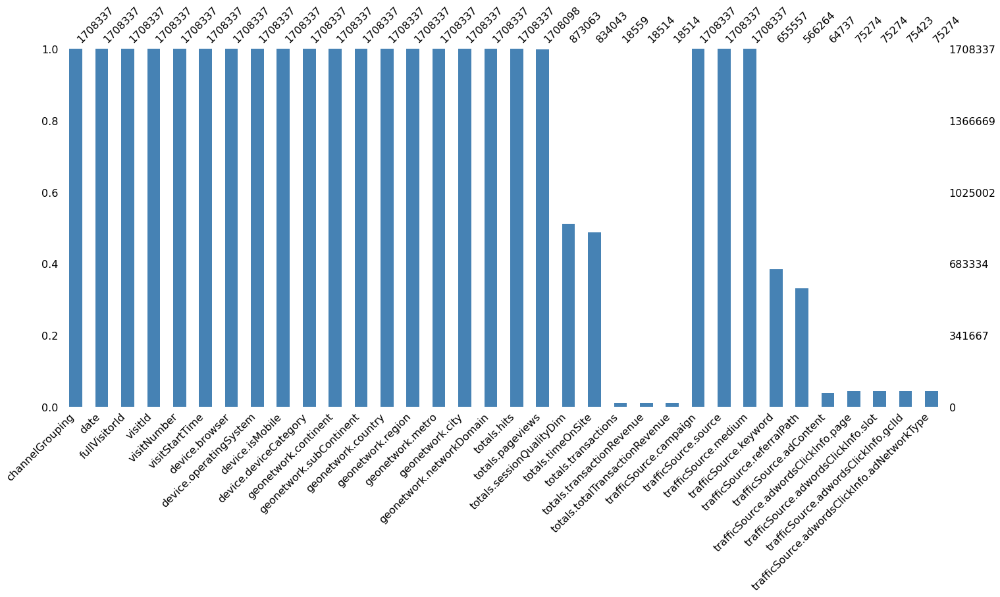

In [ ]:
# Plotting Missing values

import missingno as msno 
msno.bar(df,figsize=(24, 10),fontsize=16, labels=True,color='steelblue')
plt.show()

In [ ]:
# Now we will analyse the each missing valued feature whether it is useful or not , if it is useful then we will analyse
# how to impute missing values


In [ ]:
# so for all missing values in 'sessionQualityDim' and 'timeOnSite' feature we will fill with zeros.

df['totals.sessionQualityDim'].fillna(0,inplace=True)

df['totals.timeOnSite'].fillna (0, inplace=True)


In [ ]:
df['totals.sessionQualityDim'].isnull().sum()

0

In [ ]:
df['totals.timeOnSite'].isnull().sum()

0

In [ ]:
# trafficSource.keyword:
# For manual campaign tracking, it is the value of the utm_term campaign tracking parameter. Otherwise, its value is
#(not set)

df['trafficSource.keyword'].head(5)

0      water bottle
1               NaN
2               NaN
3    (not provided)
4    (not provided)
Name: trafficSource.keyword, dtype: object

In [ ]:
print("no.of unique values or keywords : {0}".format(df['trafficSource.keyword'].nunique()))
print("no.of records having 'nan' are : {0}".format(df['trafficSource.keyword'].astype(str).str.contains("nan").sum(axis=0)))
print("no.of records having '(not provided)' are : {0}".format(df['trafficSource.keyword'].astype(str).str.contains("(not provided)").sum(axis=0)))



no.of unique values or keywords : 4546
no.of records having 'nan' are : 1052785


/usr/local/lib/python3.7/dist-packages/pandas/core/strings.py:2001: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



no.of records having '(not provided)' are : 568933


In [ ]:
# so here idea is we will repalce the all 'nan','(not provided)' with 'others'

df['trafficSource.keyword'].replace(['nan','NaN','(not provided)'], 'others',inplace=True)
df['trafficSource.keyword'].fillna('others', inplace=True)



In [ ]:
# trafficSource.referralPath:

df['trafficSource.referralPath'].head()


# about 60% of data in this feature having 'nan'., so istead of performing any imputation we will leave as is ., so at the time of label encoding all nan's are consider as one categgory


0                                                  NaN
1    /a/google.com/transportation/mtv-services/bike...
2                                                  NaN
3                                                  NaN
4                                                  NaN
Name: trafficSource.referralPath, dtype: object

In [ ]:
# trafficSource.adwordsClickInfo.gclId: this feature is missing in 95% of data so it's better to drop this feature.

# trafficSource.adwordsClickInfo.page: this feature also missing in 95% of data ., so instead of assuming all missing 
# values are zero we will drop this feature

# trafficSource.adwordsClickInfo.slot: this feature also missing in 95% of data ., so instead of assuming all missing 
# values are another category "others" simply we will drop this feature

# trafficSource.adwordsClickInfo.adNetworkType: this feature also missing in 95% of data ., so instead of assuming all 
# missing values are another category "others" simply we will drop this feature

# trafficSource.adContent: this feature had about 95% of misssing data ., but 5 % present data seems to be informative 
# regarding ads., so all missing data consider as one category at the of label encoding.


In [ ]:
df['trafficSource.adContent'].unique()

array([nan, 'Placement Accessories 300 x 250', 'Google Merchandise Store',
       'Bags 300x250', 'Display Ad created 3/11/14',
       'Placement Office 300x250', 'Placement Drinkware 300x250',
       'Office Placement 160x600', 'Bags 336x280',
       'test_tyler_hr_merchant', 'Drinkware 336x280',
       'Official Google Merchandise', 'First Full Auto Template Test Ad',
       'Full auto ad IMAGE ONLY', '{KeyWord:Google Brand Items}',
       'Ad from 11/7/16', 'Display Ad created 3/11/15', 'Ad from 11/3/16',
       'Ad from 12/13/16', 'Google Online Store',
       'Google Merchandise Collection', 'Display Ad created 11/17/14',
       '{KeyWord:Want Google Stickers?}', '{KeyWord:Google Merchandise}',
       '{KeyWord:Google Drinkware}', "{KeyWord:Google Men's T-Shirts}",
       '{KeyWord:Google Branded Gear}',
       '{KeyWord:Google Branded Apparel}', 'Smart display ad - 8/17/2017',
       'BQ', 'Placement Accessores 300 x 250',
       'Placement Accessories 336 x 280',
       'Placeme

In [ ]:
# totals.transactions: Total number of ecommerce transactions within the session., so we will fill nulls with zeros.

# totals.totalTransactionRevenue : we will impute the missing values with zero

# totals.transactionRevenue: we will impute the missing values with zero

In [ ]:
# Null value imputation 


df["totals.transactionRevenue"].fillna(0.0, inplace=True) #customers who did not make a purchase, no 0 value

df["totals.totalTransactionRevenue"].fillna(0.0, inplace=True) #customers who did not make a purchase

df["totals.transactions"].fillna(0.0, inplace=True) #customers who did not make a purchase

df['totals.pageviews'].fillna(1, inplace=True) #atleast 1 page visited



In [ ]:
df['geonetwork.city'].replace({'(not set)':"Not Available"},inplace=True) 
df['geonetwork.continent'].replace({'(not set)':"Not Available"},inplace=True) 

In [ ]:
# Changing datatypes from object to desired ones

df['totals.pageviews'] = df['totals.pageviews'].astype(int)

df["totals.transactionRevenue"] = df["totals.transactionRevenue"].astype(float)

df["totals.totalTransactionRevenue"]=df["totals.totalTransactionRevenue"].astype(float)

df["totals.transactions"]=df["totals.transactions"].astype(float)



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1708337 entries, 0 to 1708336
Data columns (total 34 columns):
 #   Column                                        Dtype  
---  ------                                        -----  
 0   channelGrouping                               object 
 1   date                                          int64  
 2   fullVisitorId                                 object 
 3   visitId                                       int64  
 4   visitNumber                                   int64  
 5   visitStartTime                                int64  
 6   device.browser                                object 
 7   device.operatingSystem                        object 
 8   device.isMobile                               bool   
 9   device.deviceCategory                         object 
 10  geonetwork.continent                          object 
 11  geonetwork.subContinent                       object 
 12  geonetwork.country                            object 
 1

In [ ]:
# checking null values again

df_null = df.isnull().sum().sort_values(ascending = False).rename('Null').reset_index()
df_null=df_null[df_null['Null']!=0]
df_null['Null percent'] = (df_null['Null']/df.shape[0]) * 100
df_null

,index,Null,Null percent
0,trafficSource.adContent,1643600,96.210525
1,trafficSource.adwordsClickInfo.adNetworkType,1633063,95.593727
2,trafficSource.adwordsClickInfo.slot,1633063,95.593727
3,trafficSource.adwordsClickInfo.page,1633063,95.593727
4,trafficSource.adwordsClickInfo.gclId,1632914,95.585005
5,trafficSource.referralPath,1142073,66.852910


In [ ]:
df.shape

(1708337, 34)

In [ ]:
# Note:

# Actually both totaltranasactionRevenue and tranasactionRevenue refer same meaning., so we are using tranasactionRevenue
# as target feature and dropping totaltranasactionRevenue feature


In [ ]:
# Dropping null value columns

df = df.drop(['totals.totalTransactionRevenue','trafficSource.adwordsClickInfo.adNetworkType',\
              'trafficSource.adwordsClickInfo.slot', 'trafficSource.adwordsClickInfo.page',\
              'trafficSource.adwordsClickInfo.gclId'], axis=1).reset_index(drop=True)


In [ ]:
# final data after removing some columns

df.shape

(1708337, 29)

In [ ]:
df.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'visitId', 'visitNumber',
       'visitStartTime', 'device.browser', 'device.operatingSystem',
       'device.isMobile', 'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'totals.hits', 'totals.pageviews', 'totals.sessionQualityDim',
       'totals.timeOnSite', 'totals.transactions', 'totals.transactionRevenue',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent'],
      dtype='object')

In [ ]:
# extracting date features

from datetime import datetime
df["date"] = pd.to_datetime(df["date"], format="%Y%m%d") # seting the column as pandas datetime
df["weekday"] = df['date'].dt.weekday #extracting week day
df["day"] = df['date'].dt.day # extracting day
df["month"] = df['date'].dt.month # extracting day
df["year"] = df['date'].dt.year # extracting day
df['visitHour'] = (df['visitStartTime'].apply(lambda x: str(datetime.fromtimestamp(x).hour))).astype(int)
    

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1708337 entries, 0 to 1708336
Data columns (total 34 columns):
 #   Column                      Dtype         
---  ------                      -----         
 0   channelGrouping             object        
 1   date                        datetime64[ns]
 2   fullVisitorId               object        
 3   visitId                     int64         
 4   visitNumber                 int64         
 5   visitStartTime              int64         
 6   device.browser              object        
 7   device.operatingSystem      object        
 8   device.isMobile             bool          
 9   device.deviceCategory       object        
 10  geonetwork.continent        object        
 11  geonetwork.subContinent     object        
 12  geonetwork.country          object        
 13  geonetwork.region           object        
 14  geonetwork.metro            object        
 15  geonetwork.city             object        
 16  geonetwork.network

In [ ]:
# checking outliers

df.skew()

fullVisitorId                  0.342032
visitId                       -0.086483
visitNumber                   21.044975
visitStartTime                -0.086483
device.isMobile                0.800794
totals.hits                    9.691180
totals.pageviews               9.131268
totals.sessionQualityDim       7.386468
totals.timeOnSite              6.503228
totals.transactions           23.394341
totals.transactionRevenue    218.012563
weekday                        0.188174
day                            0.013903
month                         -0.203263
year                           0.064942
visitHour                     -0.269466
dtype: float64

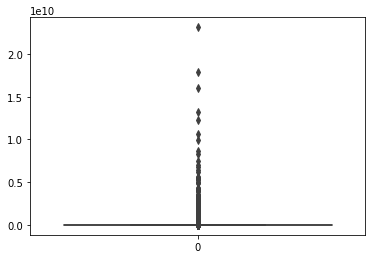

In [ ]:
sns.boxplot(data= df['totals.transactionRevenue'])

In [ ]:
# Treating outliers

print('original shape:',df.shape)

df1= df.copy()
df1.drop('date',axis=1,inplace=True)
q1=df1.quantile(0.25)
q3=df1.quantile(0.75)
IQR = q3-q1
df1 = df1[~((df1<(q1 - 1.5*IQR)) | (df1>(q3 + 1.5*IQR))).any(axis=1)]
df1 = df1.reset_index(drop=True)
print('shape after treating outliers:',df1.shape)
print(df1.skew())

original shape: (1708337, 34)
shape after treating outliers: (1094990, 33)
fullVisitorId                0.458891
visitId                     -0.048395
visitNumber                  0.000000
visitStartTime              -0.048395
device.isMobile              0.721953
totals.hits                  2.043614
totals.pageviews             2.060794
totals.sessionQualityDim     0.157683
totals.timeOnSite            2.221705
totals.transactions          0.000000
totals.transactionRevenue    0.000000
weekday                      0.165365
day                          0.010274
month                       -0.247940
year                         0.094353
visitHour                   -0.217517
dtype: float64


In [ ]:
(1094990/1708337)*100           # so using IQR method for outlier treatment is not good here

64.09683803605495

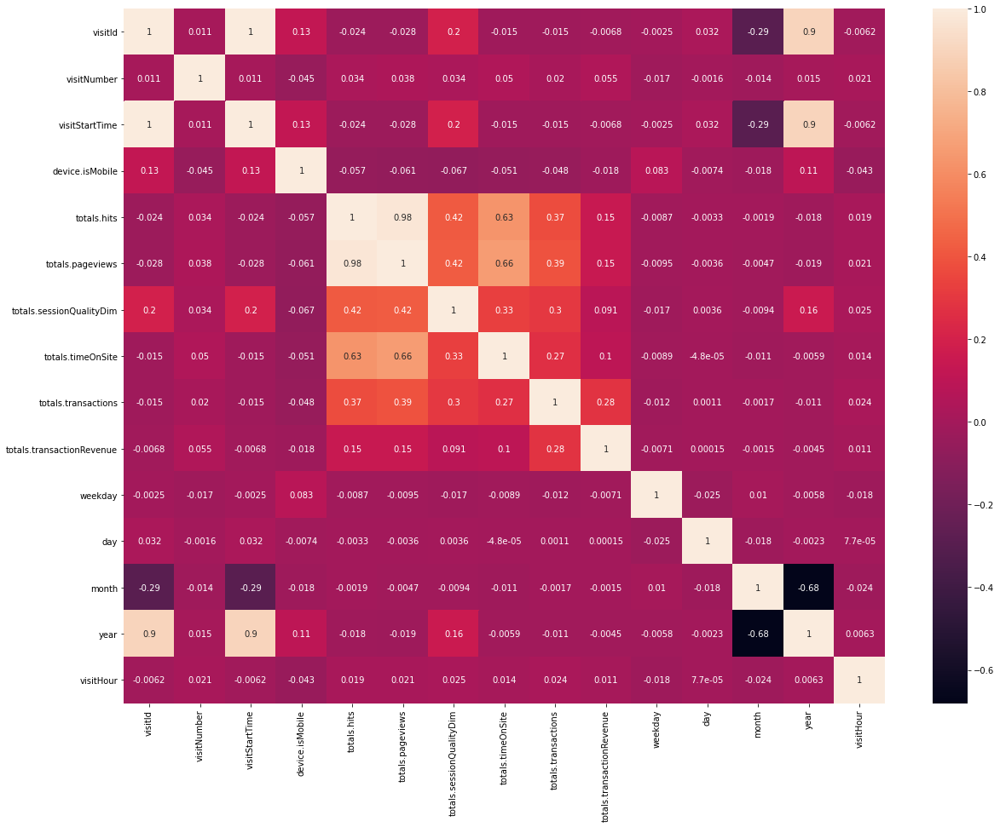

In [ ]:
# checking correlation between variables

plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [ ]:
# Inferences 

# Totals.pageviews and totals.hits are highly correlated to each other by 98% positively
# VisitID and Year are positively correlated by 90% 
# Visit start time and Year are also positively correlated by 90%
# Month and year have a negative correlation of 68% which is the highest value of negatively correlated variables

In [ ]:
df_numeric= df.select_dtypes(include=[np.number])
df_numeric.columns

Index(['visitId', 'visitNumber', 'visitStartTime', 'totals.hits',
       'totals.pageviews', 'totals.sessionQualityDim', 'totals.timeOnSite',
       'totals.transactions', 'totals.transactionRevenue', 'weekday', 'day',
       'month', 'year', 'visitHour'],
      dtype='object')

In [ ]:
# Checking MUlticollinearity between features

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = [variance_inflation_factor(df_numeric.values, i) for i in range(df_numeric.shape[1])]
pd.DataFrame({'vif': vif[:]}, index=df_numeric.columns).T


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



,visitId,visitNumber,visitStartTime,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,weekday,day,month,year,visitHour
vif,1.824686e+11,1.00643,1.824686e+11,25.559238,27.704783,1.338747,1.807164,1.300562,1.089999,1.001645,1.001804,1.087714,0.001169,1.002758


In [ ]:
# Inference: 

#  There is the presence of multicollinearity as the visitId, visitStartTime,totals.hits,totals.pageviews columns are having  VIF value > 5 
#  In order to avoid multicollinearity removal of these columns is suggested

In [ ]:
# Now our data is ready to explore

In [ ]:
# EDA:

In [ ]:
# 1 Exploring Target Variable

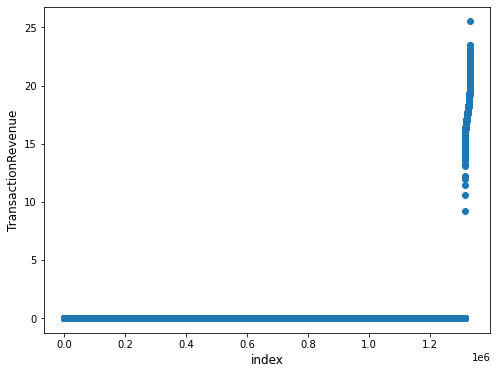

In [ ]:
gdf = df.groupby("fullVisitorId")["totals.transactionRevenue"].sum().reset_index()# for each user we are taking sum of  
                                                                                  # all his transactions

plt.figure(figsize=(8,6))
plt.scatter(range(gdf.shape[0]), np.sort(np.log1p(gdf["totals.transactionRevenue"].values)))# log(transaction_revenue)
plt.xlabel('index', fontsize=12)
plt.ylabel('TransactionRevenue', fontsize=12)
plt.show()

In [ ]:
# In the below  plot we had users index on x-axis and each user log transaction revenue value on y-axis.
# As we already discussed about 80/20 rule., by looking at this graph it was proved ., most of the transactions had 
# generated zero revenue but only few transactions had no-zero revenue.

<Figure size 1440x864 with 0 Axes>

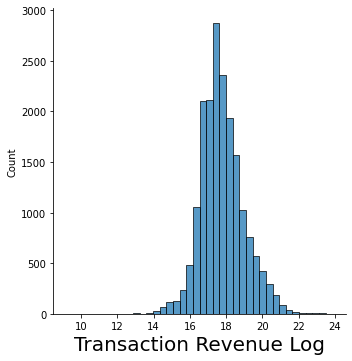

In [ ]:
plt.figure(figsize=(20,12))
sns.displot(np.log(df[df['totals.transactionRevenue'] > 0]["totals.transactionRevenue"]), bins=40)
plt.xlabel('Transaction Revenue Log', fontsize=20)
plt.show()

In [ ]:
# As we can see, only a very small percentage of people, relative to total visitors, actually contribute to the revenue


In [ ]:
# 2 non-zero transactions analysis

In [ ]:
non_zero_Revenue_records = 0
unique_users_with_non_zero_revenue = set()   # distict fullvisitorId
 
for i,j in zip(df['totals.transactionRevenue'],df['fullVisitorId']):
    if i>0:
        non_zero_Revenue_records += 1
        unique_users_with_non_zero_revenue.add(j)

print("total no.of transactions with non-zero revenue out of: {0} are: {1} and \
which is about :{2} %".format(df.shape[0],non_zero_Revenue_records,(non_zero_Revenue_records*100)/(df.shape[0])))

print("\n")

print("out of {0} customers only {1} customers are generating revenue and which is about: {2}%" \
      .format(df['fullVisitorId'].nunique(),len(unique_users_with_non_zero_revenue),\
              (len(unique_users_with_non_zero_revenue))*100/df['fullVisitorId'].nunique()))

total no.of transactions with non-zero revenue out of: 1708337 are: 18514 and which is about :1.0837440153786988 %


out of 1331776 customers only 16232 customers are generating revenue and which is about: 1.2188235859483878%


In [ ]:
# 3.Continent wise Revenue analysis

In [ ]:
continent = df[df['totals.transactionRevenue'] > 0].groupby("geonetwork.continent")["totals.transactionRevenue"].sum().reset_index()
continent

,geonetwork.continent,totals.transactionRevenue
0,Africa,9.025990e+09
1,Americas,2.265098e+12
2,Asia,2.339772e+10
3,Europe,1.124745e+10
4,Not Available,7.952200e+08
5,Oceania,6.781100e+09


In [ ]:
continent = df[df['totals.transactionRevenue'] > 0].groupby(["year","geonetwork.continent"])["totals.transactionRevenue"].sum().reset_index()
continent

,year,geonetwork.continent,totals.transactionRevenue
0,2016,Africa,5.320810e+09
1,2016,Americas,6.501851e+11
2,2016,Asia,9.004680e+09
3,2016,Europe,1.946260e+09
4,2016,Not Available,7.564900e+08
5,2016,Oceania,3.853500e+08
6,2017,Africa,3.383940e+09
7,2017,Americas,1.315202e+12
8,2017,Asia,1.199816e+10
9,2017,Europe,6.940070e+09


In [ ]:
import plotly
plotly.__version__

'4.4.1'

In [ ]:
# to enable plotly in colab notebook

# https://colab.research.google.com/notebooks/charts.ipynb#scrollTo=hFCg8XrdO4xj
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [ ]:
import plotly.express as px

continent.columns=['year','Continent','Revenue']
continent['Revenue']=continent['Revenue']/1000000000 #(in billions)

enable_plotly_in_cell()
fig = px.bar(continent,  
             x ="Continent",  
             y ="Revenue",  
             animation_frame ='year', 
             hover_name ='Continent',
             range_y =[0, 1500]) 
fig.show()

We can see from the continent wise distribution of Revenue, Americas clearly dominates across all years (All revenue figures in Billion Dollars)

Revenue in year 2017 exceeds the revenue in 2016 for all categories except Africa and Not Available.

Revenue in year 2018 falls across for all categories. 

In [ ]:
enable_plotly_in_cell()

fig = px.bar(continent,x='Continent',y='Revenue',title='Revenue across Continents',hover_name='Continent',
             color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

America has the biggest share in the Revenue(across all years), followed by Asia.

In [ ]:
# reading from files

import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/cust_rev_preprocessing.csv',dtype={'fullVisitorId': 'str'},index_col=0)

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [ ]:
df.head()

,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
0,Organic Search,2017-10-16,3162355547410993243,1508198450,1,1508198450,Firefox,Windows,False,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,1.0,0.0,0.0,0.0,(not set),google,organic,water bottle,NaN,NaN,0,16,10,2017,0
1,Referral,2017-10-16,8934116514970143966,1508176307,6,1508176307,Chrome,Chrome OS,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,(not set),2,2,2.0,28.0,0.0,0.0,(not set),sites.google.com,referral,others,/a/google.com/transportation/mtv-services/bike...,NaN,0,16,10,2017,17
2,Direct,2017-10-16,7992466427990357681,1508201613,1,1508201613,Chrome,Android,True,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,2,2,1.0,38.0,0.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,0
3,Organic Search,2017-10-16,9075655783635761930,1508169851,1,1508169851,Chrome,Windows,False,desktop,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,2,2,1.0,1.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,16
4,Organic Search,2017-10-16,6960673291025684308,1508190552,1,1508190552,Chrome,Windows,False,desktop,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,2,2,1.0,52.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,21


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1708337 entries, 0 to 1708336
Data columns (total 34 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   channelGrouping             object 
 1   date                        object 
 2   fullVisitorId               object 
 3   visitId                     int64  
 4   visitNumber                 int64  
 5   visitStartTime              int64  
 6   device.browser              object 
 7   device.operatingSystem      object 
 8   device.isMobile             bool   
 9   device.deviceCategory       object 
 10  geonetwork.continent        object 
 11  geonetwork.subContinent     object 
 12  geonetwork.country          object 
 13  geonetwork.region           object 
 14  geonetwork.metro            object 
 15  geonetwork.city             object 
 16  geonetwork.networkDomain    object 
 17  totals.hits                 int64  
 18  totals.pageviews            int64  
 19  totals.sessionQuality

In [ ]:
# EXPLORING DATE FIELD - Explored in Tableau

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1708337 entries, 0 to 1708336
Data columns (total 34 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   channelGrouping             object 
 1   date                        object 
 2   fullVisitorId               object 
 3   visitId                     int64  
 4   visitNumber                 int64  
 5   visitStartTime              int64  
 6   device.browser              object 
 7   device.operatingSystem      object 
 8   device.isMobile             bool   
 9   device.deviceCategory       object 
 10  geonetwork.continent        object 
 11  geonetwork.subContinent     object 
 12  geonetwork.country          object 
 13  geonetwork.region           object 
 14  geonetwork.metro            object 
 15  geonetwork.city             object 
 16  geonetwork.networkDomain    object 
 17  totals.hits                 int64  
 18  totals.pageviews            int64  
 19  totals.sessionQuality

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
def plt_categories(df, col):
    df1 = df.loc[:, [col, 'totals.transactionRevenue']]
    df1['totals.transactionRevenue'] = df1['totals.transactionRevenue'].astype('float')
    df1 = df1.groupby(col)['totals.transactionRevenue'].agg(['size', 'count', 'mean'])
    df1.columns = ['count', 'revenue count', 'avg revenue']
    df1['total_revenue_sum'] = df1['revenue count']* df1['avg revenue']
    df1 = df1.sort_values(by = 'count', ascending = False)
    print(df1.head(10))
    
    plt.figure(figsize=(10,20))
    plt.subplot(4, 1, 1)
    sns.barplot(df1['count'].head(10), df1.index[:10] )
    
    plt.subplot(4,1,2)
    sns.barplot(df1['revenue count'].head(10), df1.index[:10])
    
    plt.subplot(4,1,3)
    sns.barplot(df1['avg revenue'].head(10), df1.index[:10])
    
    plt.subplot(4,1,4)
    sns.barplot(df1['total_revenue_sum'].head(10), df1.index[:10])
    
    print('*'*50)

**DEVICE CATEGORY**
    :: DEVICE BROWSER

                     count  revenue count   avg revenue  total_revenue_sum
device.browser                                                            
Chrome             1173056        1173056  1.763057e+06       2.068165e+12
Safari              312165         312165  2.457066e+05       7.670099e+10
Firefox              63845          63845  2.353297e+06       1.502462e+11
Internet Explorer    35474          35474  3.370908e+05       1.195796e+10
Android Webview      34266          34266  5.431331e+03       1.861100e+08
Edge                 20543          20543  3.927031e+05       8.067300e+09
Samsung Internet     15792          15792  1.398493e+04       2.208500e+08
Opera Mini           15018          15018  0.000000e+00       0.000000e+00
Safari (in-app)      14207          14207  1.082354e+04       1.537700e+08
Opera                 9585           9585  6.205216e+04       5.947700e+08
**************************************************


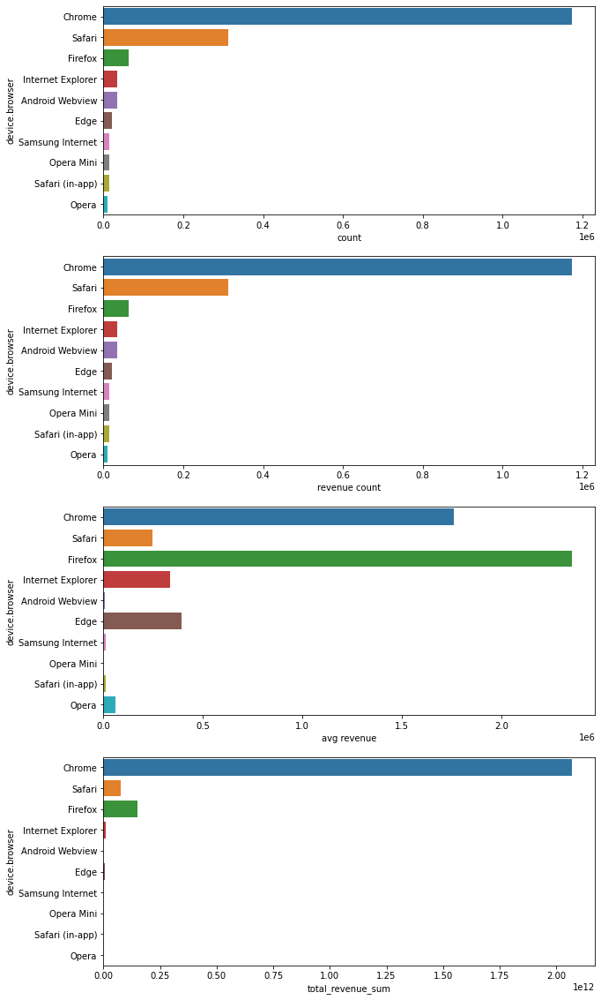

In [ ]:
plt_categories(df, 'device.browser')

In [ ]:
## INFERENCE

## As we can conclude top 15  browser are helping in generating revenue more
##Chrome browser have generated more revenue
##mean revenue generation is more for firefox and edge
##users for firefox is less but avg revenue generated is more

DEVICE CATEGORY(Desktop/Mobile/Tablet)

                         count  revenue count   avg revenue  total_revenue_sum
device.deviceCategory                                                         
desktop                1171579        1171579  1.902644e+06       2.229097e+12
mobile                  471336         471336  1.576342e+05       7.429866e+10
tablet                   65422          65422  1.979316e+05       1.294908e+10
**************************************************


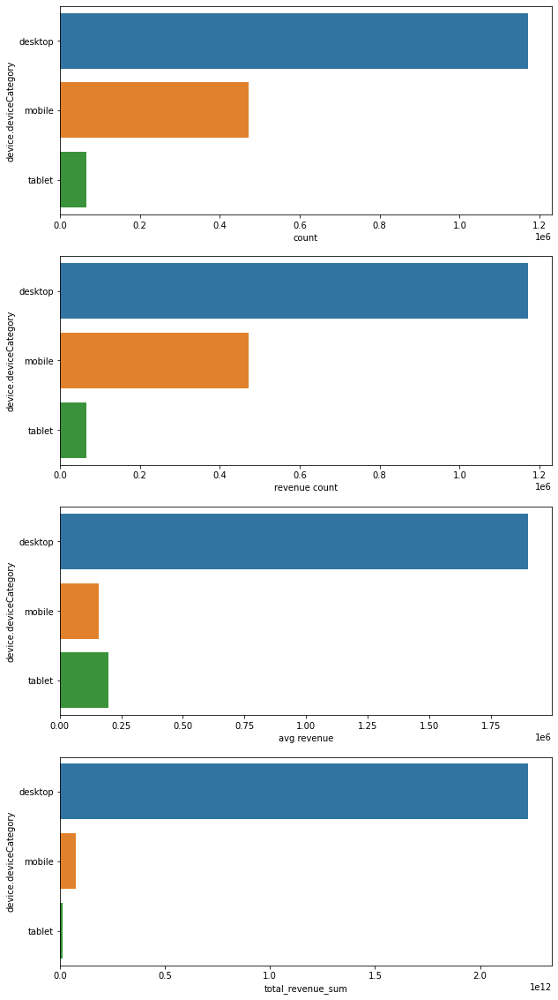

In [ ]:
plt_categories(df, 'device.deviceCategory')

In [ ]:
# Inference 
# Most of the Revenue is generated from the desktop device and very few is generated from the mobile and tablet
## we can conclue people having  device as mobile have count 471336 which is less as compared to tablet only

DEVICE OPERATING SYSTEM

                         count  revenue count   avg revenue  total_revenue_sum
device.operatingSystem                                                        
Windows                 619720         619720  9.279466e+05       5.750670e+11
Macintosh               438514         438514  2.999291e+06       1.315231e+12
Android                 299386         299386  1.677769e+05       5.023006e+10
iOS                     219334         219334  1.635867e+05       3.588012e+10
Linux                    63971          63971  1.098280e+06       7.025809e+10
Chrome OS                51318          51318  5.254534e+06       2.696522e+11
(not set)                11815          11815  0.000000e+00       0.000000e+00
Windows Phone             1675           1675  1.576119e+04       2.640000e+07
Samsung                    911            911  0.000000e+00       0.000000e+00
Tizen                      709            709  0.000000e+00       0.000000e+00
**************************************************


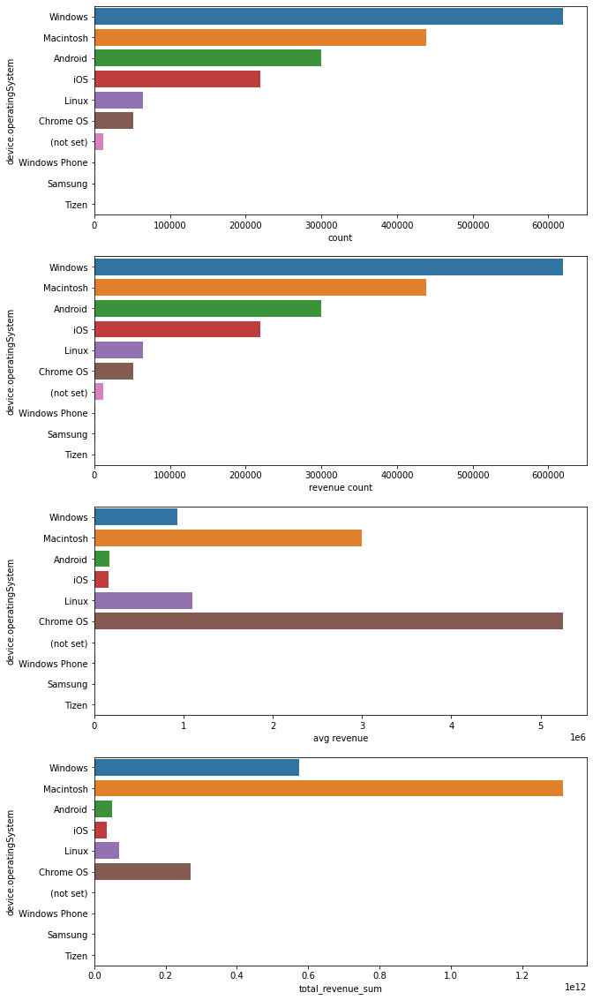

In [ ]:
plt_categories(df, 'device.operatingSystem')

In [ ]:
#revenue generating users are more in macintosh
#users are more in windows
#avg revenue is more in chrome OS

                  count  revenue count   avg revenue  total_revenue_sum
channelGrouping                                                        
Organic Search   738963         738963  7.300757e+05       5.394990e+11
Social           354971         354971  2.075598e+04       7.367770e+09
Direct           273134         273134  2.186928e+06       5.973243e+11
Referral         211307         211307  4.713621e+06       9.960210e+11
Display           51283          51283  2.111602e+06       1.082893e+11
Paid Search       45627          45627  1.467741e+06       6.696862e+10
Affiliates        32915          32915  2.628194e+04       8.650700e+08
(Other)             137            137  7.291971e+04       9.990000e+06
**************************************************


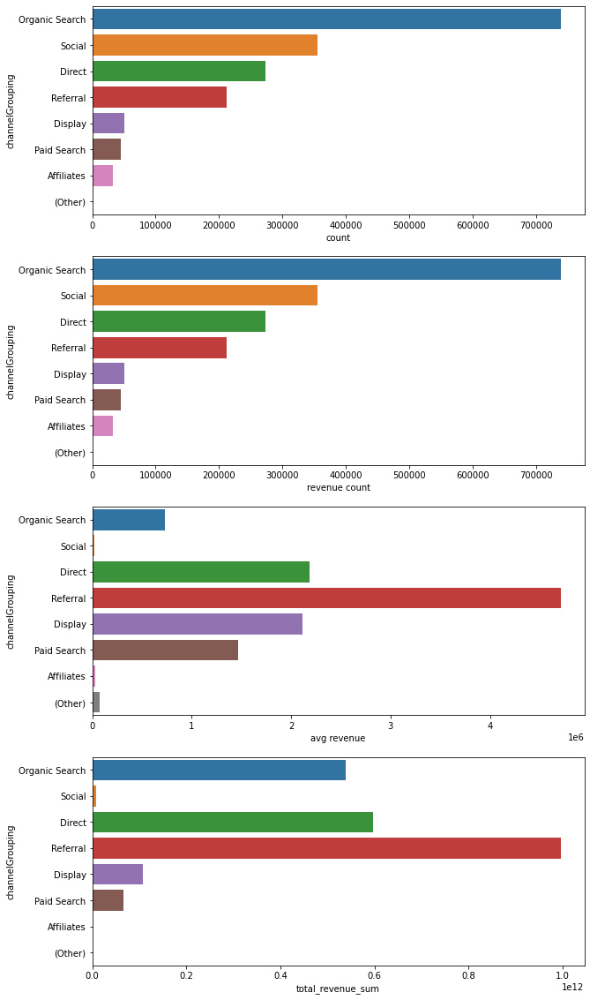

In [ ]:
plt_categories(df, 'channelGrouping')

In [ ]:
## Inference
##Organic Search, referral, Direct are the main source of revenue generation

In [ ]:
# Mobile vs non-mobile analysis:

# no.of visits with mobile and other than mobile
# total revenue generated with mobile and other than mobile

Text(0, 0.5, 'Transaction Revenue in Millions')

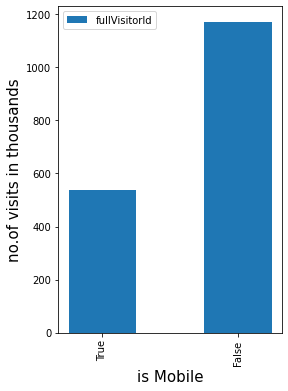

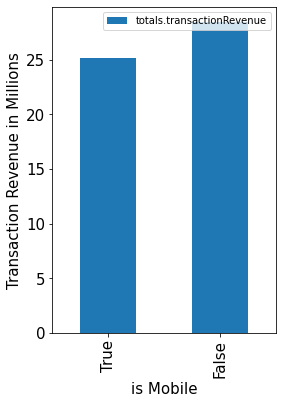

In [ ]:
temp_1 = df.groupby('device.isMobile')['fullVisitorId'].count().reset_index() # counting no.of transactions in each group.

temp_2 = df.groupby("device.isMobile")["totals.transactionRevenue"].sum().reset_index() # for each channel we are taking
                                                                                            # sum of all transactions


# for no.of visits in isMobile plot: 
# ---------------------------------------------

temp_1['fullVisitorId'] = (temp_1['fullVisitorId'])/(10**3)
temp_1.sort_values("fullVisitorId").plot(kind='bar',x='device.isMobile',y='fullVisitorId',figsize=(4,6))
plt.autoscale(True)
plt.xticks(rotation=90)       # x- axis value names will rotate in 90 degrees
plt.rc('xtick', labelsize=15) # x- axis value's font size
plt.rc('ytick', labelsize=15) # y- axis value's font size

plt.xlabel('is Mobile', fontsize=15)                         # x- axis label and font size
plt.ylabel('no.of visits in thousands', fontsize=15) # y- axis label and font size


# for revenue in isMobile plot: 
# ---------------------------------------

temp_2['totals.transactionRevenue'] = np.log1p(temp_2['totals.transactionRevenue']) # log(1 + revenue)

temp_2.sort_values("totals.transactionRevenue").plot(kind='bar',x='device.isMobile',y='totals.transactionRevenue',figsize=(4,6))
plt.xticks(rotation=90)       # x- axis value names will rotate in 90 degrees
plt.rc('xtick', labelsize=15) # x- axis value's font size
plt.rc('ytick', labelsize=15) # y- axis value's font size

plt.xlabel('is Mobile', fontsize=15)                         # x- axis label and font size
plt.ylabel('Transaction Revenue in Millions', fontsize=15) # y- axis label and font size

In [ ]:
# Inferences:
# so many users are coming through non-mobile devices and more revenue is generating from non-mobile devices

# no.of vistors are relatively very less in mobile users but they are also generating significantly good revenue as 
# compared to non-mobile users.

In [ ]:
# Analysing the effect of trafic source to the total transactions revenue -

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
df = pd.read_csv(r'drive/My Drive/cust_rev_preprocessing.csv',dtype={'fullVisitorId': 'str'},index_col=0)
df.shape

Mounted at /content/drive


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


(1708337, 34)

In [ ]:
import plotly.subplots
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected = True)
import plotly.graph_objs as go

In [ ]:
def create_count_series(df, col1, col2):
    count_series = df.groupby(col1)[col2].agg(["size", "count", "mean"])
    count_series.columns = ["count", "count_of_non_zero_revenue", "mean"]
    count_series = count_series.sort_values(by = "count", ascending = False)
    
    return count_series

In [ ]:
def horizontal_bar_chart(count_series, color):
    fig = go.Bar(
        y = count_series.index[::-1], #This will turn the sequence of index upside down, i.e. last becomes first and vice versa.
        x = count_series.values[::-1],
        showlegend = False,
        orientation = "h",
        marker = dict(
            color = color))
    return fig

In [ ]:
enable_plotly_in_cell()

count_series = create_count_series(df, "trafficSource.source", "totals.transactionRevenue")
fig1 = horizontal_bar_chart(count_series["count"].head(10), "rgba(113, 228, 228, 1)")
fig2 = horizontal_bar_chart(count_series["count_of_non_zero_revenue"].head(10), "rgba(30, 158, 158, 1)")
fig3 = horizontal_bar_chart(count_series["mean"].head(10), "rgba(21, 106, 106, 1)")

count_series = create_count_series(df, "trafficSource.medium", "totals.transactionRevenue")
fig4 = horizontal_bar_chart(count_series["count"].head(10), "rgba(113, 228, 228, 1)")
fig5 = horizontal_bar_chart(count_series["count_of_non_zero_revenue"].head(10), "rgba(30, 158, 158, 1)")
fig6 = horizontal_bar_chart(count_series["mean"].head(10), "rgba(21, 106, 106, 1)")

fig = plotly.subplots.make_subplots(rows = 2, cols = 3, vertical_spacing = 0.08, horizontal_spacing = 0.15,
                                   subplot_titles = ["Traffic Source - Count", "Traffic Source - Non_zero_revenue_count", "Traffic Source - Mean",
                                                    "Traffic Medium - Count", "Traffic Medium - Non_zero_revenue_count", "Traffic_medium - Mean"])

fig.append_trace(fig1, 1, 1)
fig.append_trace(fig2, 1, 2)
fig.append_trace(fig3, 1, 3)
fig.append_trace(fig4, 2, 1)
fig.append_trace(fig5, 2, 2)
fig.append_trace(fig6, 2, 3)

fig["layout"].update(height = 1200, width = 1200, paper_bgcolor = "rgb(233, 233, 233)", 
                    title = "Traffic Source")
py.iplot(fig, filename = "traffic_info_plots")

In [ ]:
# Inferences -
# Maximum revenue is coming from Google as a source and generating an approx revenue of more than 600k dollars
# Maxmimun revenue generating medium is Organic that is generating an approx revenue of around 600k dollars
# There is less traffic from Google but more revenue 
# In the case of cpm as a medium, more traffic while less revenue

In [ ]:
# Note-We have analyzed some columns in Tableau . A detailed report of that is attached with this notebook.

In [ ]:
# FEATURE EFEATURE TOOLS - FEATURE ENGINEERING

In [ ]:
data= df.copy()

In [ ]:
!pip install featuretools
import featuretools as ft

     |████████████████████████████████| 296kB 6.7MB/s 
     |████████████████████████████████| 686kB 9.5MB/s 
     |████████████████████████████████| 112kB 17.1MB/s 
ERROR: distributed 2021.3.1 has requirement cloudpickle>=1.5.0, but you'll have cloudpickle 1.3.0 which is incompatible.
ERROR: distributed 2021.3.1 has requirement dask>=2021.03.0, but you'll have dask 2.12.0 which is incompatible.
  Found existing installation: distributed 1.25.3
    Uninstalling distributed-1.25.3:
      Successfully uninstalled distributed-1.25.3


In [ ]:
# Selecting duplicate rows except first  
# occurrence based on all columns 
duplicate = data[data.duplicated()] 
  
print("Duplicate Rows :") 
  
# Print the resultant Dataframe 
duplicate 

Duplicate Rows :


,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour


In [ ]:
# Selecting duplicate rows based 
# on 'fullVisitorId' column 
duplicate = data[data.duplicated('fullVisitorId')] 
  
print("Duplicate Rows based on fullVisitorId :") 
  
# Print the resultant Dataframe 
duplicate 

Duplicate Rows based on fullVisitorId :


,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
114,Referral,2017-10-16,5446323589552618007,1508177720,1,1508177720,Chrome,Windows,False,desktop,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,above.net,4,4,1.0,36.0,0.0,0.0,(not set),blog.golang.org,referral,others,/gopher,NaN,0,16,10,2017,18
166,Organic Search,2017-10-16,0279576853267254132,1508205218,3,1508205218,Chrome,Macintosh,False,desktop,Americas,Northern America,Canada,Quebec,(not set),Montreal,videotron.ca,5,5,2.0,259.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,1
256,Referral,2017-10-16,2642066721958470049,1508176326,4,1508176326,Chrome,Macintosh,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Sunnyvale,(not set),6,4,2.0,35.0,0.0,0.0,(not set),(direct),(none),others,/,NaN,0,16,10,2017,17
318,Referral,2017-10-16,7491354664418615966,1508180358,5,1508180358,Chrome,Macintosh,False,desktop,Americas,Northern America,United States,Georgia,Atlanta GA,Atlanta,comcast.net,7,7,8.0,2410.0,0.0,0.0,(not set),analytics.google.com,referral,others,/analytics/web/,NaN,0,16,10,2017,18
415,Direct,2017-10-16,7290594111459836598,1508192580,2,1508192580,Chrome,Macintosh,False,desktop,Americas,Northern America,United States,California,Los Angeles CA,Los Angeles,(not set),9,9,7.0,203.0,0.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708319,Social,2017-01-04,3591531861629139100,1483534920,1,1483534920,Chrome,Macintosh,False,desktop,Europe,Northern Europe,Sweden,Stockholm County,(not set),Stockholm,dgcsystems.net,5,5,0.0,108.0,0.0,0.0,(not set),quora.com,referral,others,/Where-can-I-buy-a-stuffed-Go-language-gopher-...,NaN,2,4,1,2017,13
1708322,Social,2017-01-04,168043908052904808,1483541485,1,1483541485,Chrome,Windows,False,desktop,Europe,Southern Europe,Italy,not available in demo dataset,not available in demo dataset,not available in demo dataset,electrosystem.com,7,7,0.0,125.0,0.0,0.0,(not set),quora.com,referral,others,/Where-can-I-buy-a-stuffed-Go-language-gopher-...,NaN,2,4,1,2017,14
1708328,Social,2017-01-04,256641390199759052,1483556333,1,1483556333,Chrome,iOS,True,tablet,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,rr.com,11,7,0.0,154.0,0.0,0.0,(not set),m.youtube.com,referral,others,/watch,NaN,2,4,1,2017,18
1708335,Social,2017-01-04,2709355455991750775,1483592857,1,1483592864,Chrome,Windows,False,desktop,Asia,Southeast Asia,Indonesia,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,24,22,0.0,1274.0,0.0,0.0,(not set),facebook.com,referral,others,/l.php,NaN,2,4,1,2017,5


In [ ]:
# Selecting duplicate rows based 
# on 'visitId' column 
duplicate = data[df.duplicated('visitId')] 
  
print("Duplicate Rows based on visitId :") 
  
# Print the resultant Dataframe 
duplicate 

Duplicate Rows based on visitId :


,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
215,Referral,2017-10-16,3513051439027195874,1508160406,1,1508160406,Chrome,Windows,False,desktop,Europe,Western Europe,Belgium,Brussels,(not set),Ixelles,unknown.unknown,5,4,1.0,35.0,0.0,0.0,(not set),analytics.google.com,referral,others,/analytics/web/,NaN,0,16,10,2017,13
386,Referral,2017-10-16,1188936504674178471,1508160410,1,1508160410,Chrome,Windows,False,desktop,Europe,Western Europe,Belgium,Brussels,(not set),Ixelles,unknown.unknown,8,8,1.0,1775.0,0.0,0.0,(not set),analytics.google.com,referral,others,/analytics/web/,NaN,0,16,10,2017,13
648,Organic Search,2017-10-16,1950093081787395600,1508198371,4,1508198371,Safari,iOS,True,mobile,Europe,Northern Europe,United Kingdom,England,London,London,unknown.unknown,25,17,12.0,501.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,23
801,Organic Search,2017-10-16,2833258085821889412,1508166186,1,1508166186,Safari,iOS,True,tablet,Americas,South America,Brazil,State of Sao Paulo,(not set),Sao Paulo,virtua.com.br,1,1,1.0,0.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,15
851,Organic Search,2017-10-16,7306554404793529913,1508179119,1,1508179119,Chrome,Windows,False,desktop,Europe,Northern Europe,Denmark,not available in demo dataset,not available in demo dataset,not available in demo dataset,webspeed.dk,1,1,1.0,0.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708157,Social,2017-01-04,5644465338315325175,1483535350,1,1483535350,Android Webview,Android,True,mobile,Asia,Eastern Asia,Taiwan,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,1,1,0.0,0.0,0.0,0.0,(not set),youtube.com,referral,others,/yt/about/zh-TW/,NaN,2,4,1,2017,13
1708162,Social,2017-01-04,323091209340758527,1483576144,1,1483576144,Chrome,Macintosh,False,desktop,Americas,South America,Brazil,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,0.0,0.0,0.0,0.0,(not set),youtube.com,referral,others,/yt/about/pt-BR/,NaN,2,4,1,2017,0
1708280,Social,2017-01-04,509721399628670915,1483602789,1,1483602789,Android Webview,Android,True,mobile,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Fremont,comcast.net,2,2,0.0,37.0,0.0,0.0,(not set),m.facebook.com,referral,others,/,NaN,2,4,1,2017,7
1708297,Social,2017-01-04,494825140626072167,1483579743,1,1483579743,Chrome,Windows,False,desktop,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),3,3,0.0,105.0,0.0,0.0,(not set),youtube.com,referral,others,/yt/about/ru/,NaN,2,4,1,2017,1


In [ ]:
data.shape

(1708337, 34)

In [ ]:
data.drop_duplicates(subset=['visitId'],inplace=True)

In [ ]:
data.shape

(1665802, 34)

In [ ]:
sales = df['totals.transactionRevenue']
data.drop(['totals.transactionRevenue'], axis=1, inplace=True)

In [ ]:
data['id'] = data['visitId']
data.drop(['visitId'], axis=1, inplace=True)

In [ ]:
# creating and entity set 'es'
es = ft.EntitySet(id = 'sales')

# adding a dataframe 
es.entity_from_dataframe(entity_id = 'gstore', dataframe = data, index = 'id')

Entityset: sales
  Entities:
    gstore [Rows: 1665802, Columns: 33]
  Relationships:
    No relationships

In [ ]:
feature_matrix, feature_names = ft.dfs(entityset=es, 
target_entity = 'gstore', 
max_depth = 2, 
verbose = 1, 
n_jobs =1)

Built 35 features
Elapsed: 00:12 | Progress: 100%|██████████


In [ ]:
feature_matrix.head()

,channelGrouping,fullVisitorId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour,DAY(date),MONTH(date),WEEKDAY(date),YEAR(date)
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1508198450,Organic Search,3162355547410993243,1,1508198450,Firefox,Windows,False,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,1.0,0.0,0.0,(not set),google,organic,water bottle,NaN,NaN,0,16,10,2017,0,16,10,0,2017
1508176307,Referral,8934116514970143966,6,1508176307,Chrome,Chrome OS,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,(not set),2,2,2.0,28.0,0.0,(not set),sites.google.com,referral,others,/a/google.com/transportation/mtv-services/bike...,NaN,0,16,10,2017,17,16,10,0,2017
1508201613,Direct,7992466427990357681,1,1508201613,Chrome,Android,True,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,2,2,1.0,38.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,0,16,10,0,2017
1508169851,Organic Search,9075655783635761930,1,1508169851,Chrome,Windows,False,desktop,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,2,2,1.0,1.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,16,16,10,0,2017
1508190552,Organic Search,6960673291025684308,1,1508190552,Chrome,Windows,False,desktop,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,2,2,1.0,52.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,21,16,10,0,2017


In [ ]:
# MODEL BUILDING

In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/MyDrive/cust_rev_preprocessing.csv',dtype={'fullVisitorId': 'str'},index_col=0)
df.head()

Mounted at /content/drive


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
0,Organic Search,2017-10-16,3162355547410993243,1508198450,1,1508198450,Firefox,Windows,False,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,1.0,0.0,0.0,0.0,(not set),google,organic,water bottle,NaN,NaN,0,16,10,2017,0
1,Referral,2017-10-16,8934116514970143966,1508176307,6,1508176307,Chrome,Chrome OS,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,(not set),2,2,2.0,28.0,0.0,0.0,(not set),sites.google.com,referral,others,/a/google.com/transportation/mtv-services/bike...,NaN,0,16,10,2017,17
2,Direct,2017-10-16,7992466427990357681,1508201613,1,1508201613,Chrome,Android,True,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,2,2,1.0,38.0,0.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,0
3,Organic Search,2017-10-16,9075655783635761930,1508169851,1,1508169851,Chrome,Windows,False,desktop,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,2,2,1.0,1.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,16
4,Organic Search,2017-10-16,6960673291025684308,1508190552,1,1508190552,Chrome,Windows,False,desktop,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,2,2,1.0,52.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,21


In [ ]:
# Building Base model

df.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'visitId', 'visitNumber',
       'visitStartTime', 'device.browser', 'device.operatingSystem',
       'device.isMobile', 'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'totals.hits', 'totals.pageviews', 'totals.sessionQualityDim',
       'totals.timeOnSite', 'totals.transactions', 'totals.transactionRevenue',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent', 'weekday',
       'day', 'month', 'year', 'visitHour'],
      dtype='object')

In [ ]:
df.shape

(1708337, 34)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1708337 entries, 0 to 1708336
Data columns (total 34 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   channelGrouping             object 
 1   date                        object 
 2   fullVisitorId               object 
 3   visitId                     int64  
 4   visitNumber                 int64  
 5   visitStartTime              int64  
 6   device.browser              object 
 7   device.operatingSystem      object 
 8   device.isMobile             bool   
 9   device.deviceCategory       object 
 10  geonetwork.continent        object 
 11  geonetwork.subContinent     object 
 12  geonetwork.country          object 
 13  geonetwork.region           object 
 14  geonetwork.metro            object 
 15  geonetwork.city             object 
 16  geonetwork.networkDomain    object 
 17  totals.hits                 int64  
 18  totals.pageviews            int64  
 19  totals.sessionQuality

In [ ]:
dataoriginal=df.copy()

In [ ]:
df[df['totals.transactionRevenue']>0]['totals.transactionRevenue'].head(15)

In [ ]:
df_target= np.log1p(df['totals.transactionRevenue'])
df_feature= df.drop(['date','fullVisitorId','visitId','totals.transactionRevenue'],axis=1,inplace=True)


In [ ]:
# separating numerical col

df_numeric= df.select_dtypes(include=[np.number])
df_numeric.columns

Index(['visitNumber', 'visitStartTime', 'totals.hits', 'totals.pageviews',
       'totals.sessionQualityDim', 'totals.timeOnSite', 'totals.transactions',
       'weekday', 'day', 'month', 'year', 'visitHour'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
X_std=pd.DataFrame(sc.fit_transform(df_numeric),columns=df_numeric.columns)

In [ ]:
X_std.head()

,visitNumber,visitStartTime,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,weekday,day,month,year,visitHour
0,-0.142737,0.605943,-0.381416,-0.416481,-0.109881,-0.349443,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792
1,0.391791,0.604581,-0.270203,-0.261990,0.010105,-0.270448,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897
2,-0.142737,0.606138,-0.270203,-0.261990,-0.109881,-0.242236,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792
3,-0.142737,0.604183,-0.270203,-0.261990,-0.109881,-0.346622,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798
4,-0.142737,0.605457,-0.270203,-0.261990,-0.109881,-0.202739,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295


In [ ]:
df_cat = df.select_dtypes(include=[np.object])

# display categorical features

df_cat.columns

Index(['channelGrouping', 'device.browser', 'device.operatingSystem',
       'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent'],
      dtype='object')

In [ ]:
# Here we are performing the Label Encoding for categorical features. We are not using one-hot encoding because of it will increase the
# dimensionality of data.

In [ ]:
from sklearn.preprocessing import LabelEncoder


categorical_feat = ['channelGrouping', 'device.browser', 'device.operatingSystem',
       'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent']
for feature in categorical_feat:
    
    label_encoder = LabelEncoder() # initializing        label encoder object
    
    label_encoder.fit(list(df[feature].values.astype('str')))
                                                             
# fit with list of variables in that feature
    
    df_cat[feature] = label_encoder.transform(list(df[feature].values.astype('str'))) 

    print("for this feature : {0} label-encoding was done succesfully".format(feature))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


for this feature : channelGrouping label-encoding was done succesfully
for this feature : device.browser label-encoding was done succesfully
for this feature : device.operatingSystem label-encoding was done succesfully
for this feature : device.deviceCategory label-encoding was done succesfully
for this feature : geonetwork.continent label-encoding was done succesfully
for this feature : geonetwork.subContinent label-encoding was done succesfully
for this feature : geonetwork.country label-encoding was done succesfully
for this feature : geonetwork.region label-encoding was done succesfully
for this feature : geonetwork.metro label-encoding was done succesfully
for this feature : geonetwork.city label-encoding was done succesfully
for this feature : geonetwork.networkDomain label-encoding was done succesfully
for this feature : trafficSource.campaign label-encoding was done succesfully
for this feature : trafficSource.source label-encoding was done succesfully
for this feature : traffi

In [ ]:
df_cat.head()

,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
X_final = pd.concat([X_std, df_cat], axis=1)

X_final.head()

,visitNumber,visitStartTime,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,weekday,day,month,year,visitHour,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,-0.142737,0.605943,-0.381416,-0.416481,-0.109881,-0.349443,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,0.391791,0.604581,-0.270203,-0.261990,0.010105,-0.270448,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,-0.142737,0.606138,-0.270203,-0.261990,-0.109881,-0.242236,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,-0.142737,0.604183,-0.270203,-0.261990,-0.109881,-0.346622,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,-0.142737,0.605457,-0.270203,-0.261990,-0.109881,-0.202739,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
X_final.shape

(1708337, 29)

In [ ]:
# saving the processed data into file:

# storing data frames as csv files:
X_final.to_csv('X_final.csv')


In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score,KFold,train_test_split

xtrain,xtest,ytrain,ytest=train_test_split(X_final,df_target,test_size=0.3,random_state=1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
xtrain.shape ,xtest.shape ,ytrain.shape ,ytest.shape

((1195835, 29), (512502, 29), (1195835,), (512502,))

In [ ]:
#Build a linear model

import statsmodels.api as sm
X_train_lm = sm.add_constant(xtrain)

lr_1 = sm.OLS(ytrain, X_train_lm).fit()

lr_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     totals.transactionRevenue   R-squared:                       0.874
Model:                                   OLS   Adj. R-squared:                  0.874
Method:                        Least Squares   F-statistic:                 2.853e+05
Date:                       Sat, 27 Mar 2021   Prob (F-statistic):               0.00
Time:                               10:31:26   Log-Likelihood:            -1.1931e+06
No. Observations:                    1195835   AIC:                         2.386e+06
Df Residuals:                        1195805   BIC:                         2.387e+06
Df Model:                                 29                                         
Covariance Type:                   nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          0.2406      0.009     26.332      0.000       0.223       0.259
visitNumber                   -0.0013      0.001     -2.232      0.026      -0.003      -0.000
visitStartTime                -0.8052      0.157     -5.133      0.000      -1.113      -0.498
totals.hits                    0.1232      0.003     41.356      0.000       0.117       0.129
totals.pageviews              -0.1520      0.003    -48.679      0.000      -0.158      -0.146
totals.sessionQualityDim       0.0868      0.001    124.015      0.000       0.085       0.088
totals.timeOnSite              0.0247      0.001     30.450      0.000       0.023       0.026
totals.transactions            1.7015      0.001   2559.448      0.000       1.700       1.703
weekday                       -0.0011      0.001     -1.856      0.063      -0.002    6.29e-05
day                            0.0370      0.007      5.077      0.000       0.023       0.051
month                          0.4643      0.094      4.928      0.000       0.280       0.649
year                           1.0226      0.205      4.989      0.000       0.621       1.424
visitHour                      0.0013      0.001      2.178      0.029       0.000       0.003
channelGrouping                0.0038      0.001      4.453      0.000       0.002       0.005
device.browser             -4.997e-05   4.39e-05     -1.139      0.255      -0.000     3.6e-05
device.operatingSystem        -0.0005    7.7e-05     -6.453      0.000      -0.001      -0.000
device.deviceCategory         -0.0064      0.001     -5.133      0.000      -0.009      -0.004
geonetwork.continent          -0.0062      0.001     -8.675      0.000      -0.008      -0.005
geonetwork.subContinent       -0.0004      0.000     -3.179      0.001      -0.001      -0.000
geonetwork.country          8.171e-05      1e-05      8.169      0.000    6.21e-05       0.000
geonetwork.region           2.593e-05   5.05e-06      5.132      0.000     1.6e-05    3.58e-05
geonetwork.metro            5.545e-05   2.13e-05      2.607      0.009    1.38e-05    9.71e-05
geonetwork.city            -1.845e-05   4.09e-06     -4.509      0.000   -2.65e-05   -1.04e-05
geonetwork.networkDomain   -1.841e-07   3.89e-08     -4.727      0.000    -2.6e-07   -1.08e-07
trafficSource.campaign        -0.0007      0.000     -1.811      0.070      -0.001     5.4e-05
trafficSource.source          -0.0001   1.05e-05    -10.631      0.000      -0.000   -9.12e-05
trafficSource.medium          -0.0021      0.000     -5.361      0.000      -0.003      -0.001
trafficSource.keyword      -2.804e-06    1.8e-06     -1.561      0.118   -6.32e-06    7.16e-07
trafficSource.referralPath -1.149e-05   9.91e-07    -11.601  

In [ ]:
pvalue=lr_1.pvalues
pvalue[lr_1.pvalues<0.05]

const                         9.241244e-153
visitNumber                    2.564377e-02
visitStartTime                 2.858082e-07
totals.hits                    0.000000e+00
totals.pageviews               0.000000e+00
totals.sessionQualityDim       0.000000e+00
totals.timeOnSite             1.453496e-203
totals.transactions            0.000000e+00
day                            3.844320e-07
month                          8.303198e-07
year                           6.061518e-07
visitHour                      2.944318e-02
channelGrouping                8.474526e-06
device.operatingSystem         1.100607e-10
device.deviceCategory          2.845501e-07
geonetwork.continent           4.128497e-18
geonetwork.subContinent        1.477705e-03
geonetwork.country             3.111872e-16
geonetwork.region              2.868255e-07
geonetwork.metro               9.142831e-03
geonetwork.city                6.519715e-06
geonetwork.networkDomain       2.275859e-06
trafficSource.source           2

In [ ]:
# Through sklearn package

In [ ]:
from sklearn.linear_model import LinearRegression

LR= LinearRegression()

In [ ]:
LR.fit(xtrain,ytrain)
y_pred= LR.predict(xtest)

In [ ]:
LR.score(xtrain,ytrain)

0.8737148253569458

In [ ]:
LR.score(xtest,ytest)

0.8681208618216643

In [ ]:
from sklearn.metrics import r2_score
r2_score(y_true = ytest, y_pred = y_pred)

0.8681208618216643

In [ ]:
y_pred

array([ 0.0252973 , -0.0094504 ,  0.00036762, ...,  0.02410219,
        0.01790654,  0.04003252])

In [ ]:
# calculating training error

y_pred_train= LR.predict(xtrain)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.6562614590596814


In [ ]:
# calculating test error

y_pred_test= LR.predict(xtest)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.6674110875189365


In [ ]:
# Training error: 0.6562614590596814
# Test error: 0.6674110875189365

In [ ]:
# From these scores we can conclude that model is not suffering from variance error means model is not overfitting

In [ ]:
# validating the above model using K - cross validation 

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(LR,X_final,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.6606075401573032
Variance Error : 0.13390115784003395


In [ ]:
z = []   #for model comparison later
z.append(['Linear Regression',r2_score(y_true = ytest, y_pred = y_pred),rmse_train,rmse_test,np.mean(rmse),np.std(rmse,ddof=1)])

In [ ]:
# Bias Error: 0.6606075401573032
# Variance Error : 0.13390115784003395

In [ ]:
Xout = df.copy()  #dataset for outlier treatment

In [ ]:
!pip install pyod  #throwing error without installation
!pip install combo
import numpy as np
from scipy import stats
import pyod
import combo
import pandas as pd

     |████████████████████████████████| 102kB 4.3MB/s 
  Created wheel for pyod: filename=pyod-0.8.7-cp37-none-any.whl size=115979 sha256=9a7241c96e87bd010a58523755171bd998913532ecdc0d53e87732d258298f95
  Stored in directory: /root/.cache/pip/wheels/b7/8a/c9/5fe3f32692ad445fe573cf5b953d7a0d55dc1f7c8e229ebda0
Successfully built pyod
  Created wheel for combo: filename=combo-0.1.2-cp37-none-any.whl size=42028 sha256=90635c688fdcf252d09ef54cbc68cdf80e6da3c51fd35767ffc44e267346ec1d
  Stored in directory: /root/.cache/pip/wheels/01/d9/bf/d1a371a5f0844cd8a53c04c14daa89974c93f429dda9dceb86
Successfully built combo


In [ ]:
Tout = df_target.copy()
Tout.shape

(1708337,)

In [ ]:
Xout.shape

(1708337, 30)

In [ ]:
##variables to transform for outlier treatment

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1)) 
Xout[['totals.hits','totals.timeOnSite']] = scaler.fit_transform(Xout[['totals.hits', 'totals.timeOnSite']])
Xout[['totals.hits','totals.timeOnSite']].head()

df_numeric= Xout.select_dtypes(include=[np.number])
df_numeric=df_numeric.drop(['totals.hits','totals.timeOnSite'],axis=1)
df_numeric.columns

Index(['visitNumber', 'visitStartTime', 'totals.pageviews',
       'totals.sessionQualityDim', 'totals.transactions', 'weekday', 'day',
       'month', 'year', 'visitHour'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
X_std=pd.DataFrame(sc.fit_transform(df_numeric),columns=df_numeric.columns)
X_std['totals.hits']=Xout['totals.hits']
X_std['totals.timeOnSite']=Xout['totals.timeOnSite']

In [ ]:
X_std.head()

,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite
0,-0.142737,0.605943,-0.416481,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.000000,0.000000
1,0.391791,0.604581,-0.261990,0.010105,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,0.002004,0.001472
2,-0.142737,0.606138,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.002004,0.001998
3,-0.142737,0.604183,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,0.002004,0.000053
4,-0.142737,0.605457,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,0.002004,0.002734


In [ ]:
#For outliers treatment
from scipy import stats
import pyod
import combo
import matplotlib.pyplot as plt

from pyod.models.cblof import CBLOF #Clustering Based Local Outlier Factor
from pyod.models.iforest import IForest  #isolation forest
from pyod.models.pca import PCA  # PCA 

X1 = X_std['totals.hits'].values.reshape(-1,1)
X2 = X_std['totals.timeOnSite'].values.reshape(-1,1)
X = np.concatenate((X1,X2),axis=1)

random_state = np.random.RandomState(7)
outliers_fraction = 0.05
classifiers = {
        'Cluster-based Local Outlier Factor (CBLOF)':CBLOF(contamination=outliers_fraction,check_estimator=False, random_state=random_state),
        'Principal Component Analysis (PCA)': PCA(contamination=outliers_fraction, random_state=random_state),
        'Isolation Forest': IForest(contamination=outliers_fraction,random_state=random_state)
}

 

OUTLIERS :  85417 INLIERS :  1622920 Cluster-based Local Outlier Factor (CBLOF)


<Figure size 1152x576 with 0 Axes>

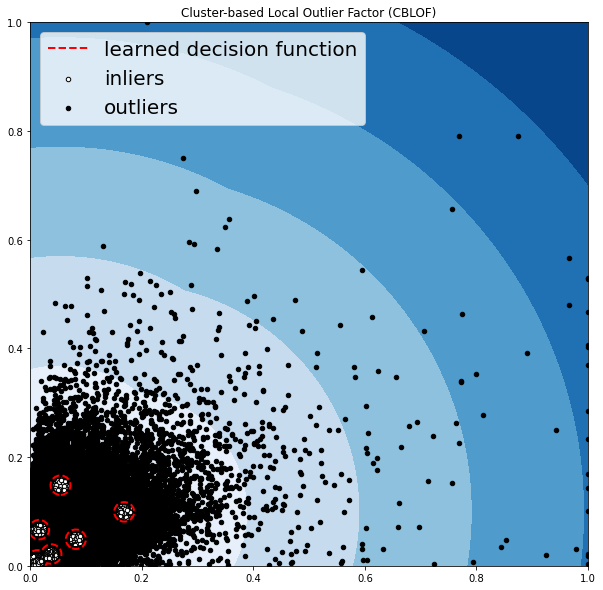

OUTLIERS :  85414 INLIERS :  1622923 Principal Component Analysis (PCA)


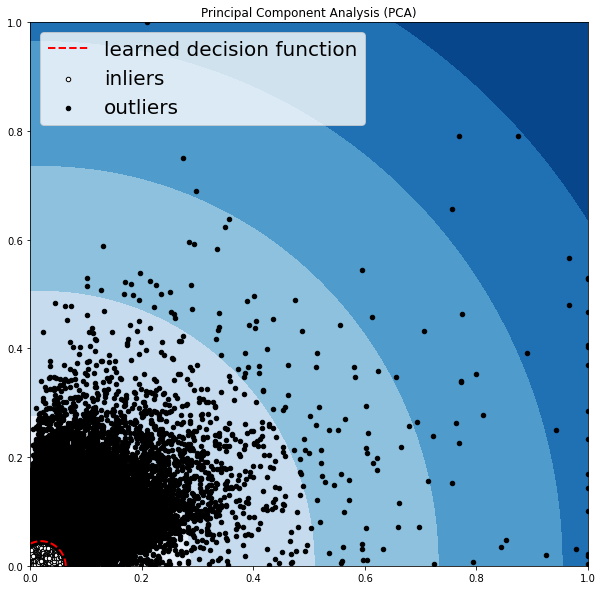

OUTLIERS :  85396 INLIERS :  1622941 Isolation Forest


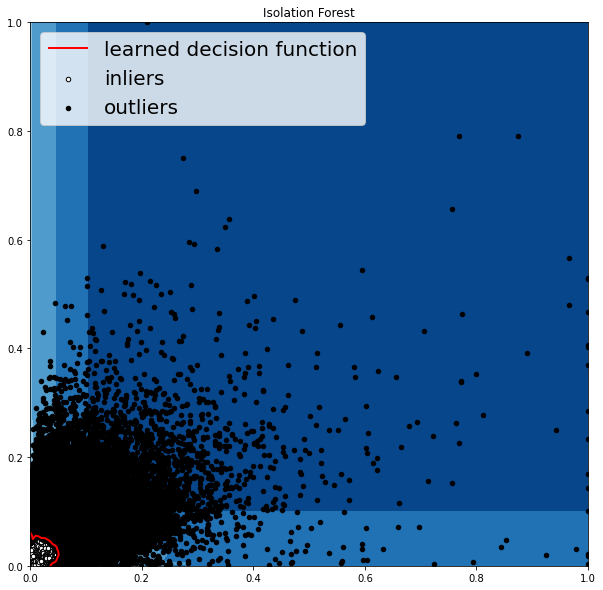

In [ ]:
import matplotlib
xx , yy = np.meshgrid(np.linspace(0,1, 200), np.linspace(0, 1, 200))
plt.figure(figsize=(16,8))
k= 0

for i, (clf_name, clf) in enumerate(classifiers.items()):
    clf.fit(X)
    
   # predict outlier score
    scores_pred = clf.decision_function(X) * -1
        
    # prediction of a datapoint category outlier or inlier
    y_pred = clf.predict(X)
    n_inliers = len(y_pred) - np.count_nonzero(y_pred)
    n_outliers = np.count_nonzero(y_pred == 1)
    plt.figure(figsize=(10, 10))
    
    # copy of dataframe
    dfx = X_std.copy()
    dfx['outlier'] = y_pred.tolist()
    X_std[clf_name]=y_pred.tolist()
    
    # IX1 - inlier feature 1,  IX2 - inlier feature 2
    IX1 =  np.array(dfx['totals.hits'][dfx['outlier'] == 0]).reshape(-1,1)
    IX2 =  np.array(dfx['totals.timeOnSite'][dfx['outlier'] == 0]).reshape(-1,1)
    
    # OX1 - outlier feature 1, OX2 - outlier feature 2
    OX1 =  np.array(dfx['totals.hits'][dfx['outlier'] == 1]).reshape(-1,1)
    OX2 =  np.array(dfx['totals.timeOnSite'][dfx['outlier'] == 1]).reshape(-1,1)
    
    print('OUTLIERS : ',n_outliers,'INLIERS : ',n_inliers, clf_name)
        
    # threshold value to consider a datapoint inlier or outlier
    threshold = stats.scoreatpercentile(scores_pred,100 * outliers_fraction)
        
    # decision function calculates the raw anomaly score for every point
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
    Z = Z.reshape(xx.shape)
          
    # fill blue map colormap from minimum anomaly score to threshold value
    plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
        
    # draw red contour line where anomaly score is equal to thresold
    a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
        
    # fill orange contour lines where range of anomaly score is from threshold to maximum anomaly score
    plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
        
    b = plt.scatter(IX1,IX2, c='white',s=20, edgecolor='k')
    
    c = plt.scatter(OX1,OX2, c='black',s=20, edgecolor='k')
       
    plt.axis('tight')  
    
    # loc=2 is used for the top left corner 
    plt.legend(
        [a.collections[0], b,c],
        ['learned decision function', 'inliers','outliers'],
        prop=matplotlib.font_manager.FontProperties(size=20),
        loc=2)
      
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.title(clf_name)
    plt.show()


In [ ]:
X_std.columns[-3:]

Index(['Cluster-based Local Outlier Factor (CBLOF)',
       'Principal Component Analysis (PCA)', 'Isolation Forest'],
      dtype='object')

In [ ]:
X_std['outlierpred']=X_std[['Cluster-based Local Outlier Factor (CBLOF)','Principal Component Analysis (PCA)', 'Isolation Forest']].mode(axis=1)
X_std.drop(['Cluster-based Local Outlier Factor (CBLOF)','Principal Component Analysis (PCA)', 'Isolation Forest'],axis=1,inplace=True)
X_std.columns

Index(['visitNumber', 'visitStartTime', 'totals.pageviews',
       'totals.sessionQualityDim', 'totals.transactions', 'weekday', 'day',
       'month', 'year', 'visitHour', 'totals.hits', 'totals.timeOnSite',
       'outlierpred'],
      dtype='object')

In [ ]:
#treating cols same as prior
df_cat = Xout.select_dtypes(include=[np.object])
from sklearn.preprocessing import LabelEncoder


categorical_feat = ['channelGrouping', 'device.browser', 'device.operatingSystem',
       'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent']
for feature in categorical_feat:
    
    label_encoder = LabelEncoder() # initializing        label encoder object
    
    label_encoder.fit(list(Xout[feature].values.astype('str')))
                                                             
# fit with list of variables in that feature
    
    df_cat[feature] = label_encoder.transform(list(Xout[feature].values.astype('str'))) 

    print("for this feature : {0} label-encoding was done succesfully".format(feature))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


for this feature : channelGrouping label-encoding was done succesfully
for this feature : device.browser label-encoding was done succesfully
for this feature : device.operatingSystem label-encoding was done succesfully
for this feature : device.deviceCategory label-encoding was done succesfully
for this feature : geonetwork.continent label-encoding was done succesfully
for this feature : geonetwork.subContinent label-encoding was done succesfully
for this feature : geonetwork.country label-encoding was done succesfully
for this feature : geonetwork.region label-encoding was done succesfully
for this feature : geonetwork.metro label-encoding was done succesfully
for this feature : geonetwork.city label-encoding was done succesfully
for this feature : geonetwork.networkDomain label-encoding was done succesfully
for this feature : trafficSource.campaign label-encoding was done succesfully
for this feature : trafficSource.source label-encoding was done succesfully
for this feature : traffi

In [ ]:
X_final_out = pd.concat([X_std, df_cat], axis=1)

X_final_out.head()

,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite,outlierpred,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,-0.142737,0.605943,-0.416481,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.000000,0.000000,0,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,0.391791,0.604581,-0.261990,0.010105,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,0.002004,0.001472,0,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,-0.142737,0.606138,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.002004,0.001998,0,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,-0.142737,0.604183,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,0.002004,0.000053,0,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,-0.142737,0.605457,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,0.002004,0.002734,0,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
a = X_final_out.index[X_final_out['outlierpred']==1]
X_final_out.drop(a,inplace=True)
X_final_out.head()

,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite,outlierpred,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,-0.142737,0.605943,-0.416481,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.000000,0.000000,0,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,0.391791,0.604581,-0.261990,0.010105,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,0.002004,0.001472,0,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,-0.142737,0.606138,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.002004,0.001998,0,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,-0.142737,0.604183,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,0.002004,0.000053,0,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,-0.142737,0.605457,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,0.002004,0.002734,0,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
X_final_out.shape

(1622477, 30)

In [ ]:
Tout=df_target.copy()
print (len(Tout))
Tout.drop(labels = a,inplace=True)
print (len(Tout))
X_final_out.drop(['outlierpred'],axis=1,inplace=True)

1708337
1622477


In [ ]:
# saving the processed data into file:

# storing data frames as csv files:
X_final_out.to_csv('X_final_out.csv')


In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score,KFold,train_test_split

xtraino,xtesto,ytraino,ytesto=train_test_split(X_final_out,Tout,test_size=0.3,random_state=1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
xtraino.shape ,xtesto.shape ,ytraino.shape ,ytesto.shape

((1135733, 29), (486744, 29), (1135733,), (486744,))

In [ ]:
#Build a linear model post outlier treatment

import statsmodels.api as sm
X_train_lm = sm.add_constant(xtraino)

lr_1 = sm.OLS(ytraino, X_train_lm).fit()

lr_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     totals.transactionRevenue   R-squared:                       0.991
Model:                                   OLS   Adj. R-squared:                  0.991
Method:                        Least Squares   F-statistic:                 4.087e+06
Date:                       Sat, 27 Mar 2021   Prob (F-statistic):               0.00
Time:                               12:26:47   Log-Likelihood:             8.8355e+05
No. Observations:                    1135733   AIC:                        -1.767e+06
Df Residuals:                        1135703   BIC:                        -1.767e+06
Df Model:                                 29                                         
Covariance Type:                   nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          0.1964      0.002    120.436      0.000       0.193       0.200
visitNumber                    0.0006      0.000      5.136      0.000       0.000       0.001
visitStartTime                -0.0651      0.027     -2.388      0.017      -0.118      -0.012
totals.pageviews              -0.0110      0.001    -11.431      0.000      -0.013      -0.009
totals.sessionQualityDim       0.0015      0.000      8.380      0.000       0.001       0.002
totals.transactions            1.9998      0.000   1.03e+04      0.000       1.999       2.000
weekday                       -0.0003      0.000     -3.018      0.003      -0.001      -0.000
day                            0.0029      0.001      2.291      0.022       0.000       0.005
month                          0.0387      0.016      2.365      0.018       0.007       0.071
year                           0.0846      0.036      2.376      0.018       0.015       0.154
visitHour                   5.509e-05      0.000      0.518      0.604      -0.000       0.000
totals.hits                    0.6421      0.056     11.449      0.000       0.532       0.752
totals.timeOnSite              0.0816      0.021      3.799      0.000       0.039       0.124
channelGrouping                0.0002      0.000      1.590      0.112   -5.51e-05       0.001
device.browser             -7.264e-06   7.56e-06     -0.961      0.336   -2.21e-05    7.54e-06
device.operatingSystem     -2.589e-05   1.33e-05     -1.943      0.052    -5.2e-05    2.27e-07
device.deviceCategory         -0.0003      0.000     -1.342      0.180      -0.001       0.000
geonetwork.continent           0.0002      0.000      1.338      0.181   -7.74e-05       0.000
geonetwork.subContinent    -6.945e-06    2.3e-05     -0.302      0.763    -5.2e-05    3.82e-05
geonetwork.country         -8.722e-07   1.73e-06     -0.504      0.614   -4.26e-06    2.52e-06
geonetwork.region          -1.225e-06   8.86e-07     -1.383      0.167   -2.96e-06    5.11e-07
geonetwork.metro            1.117e-06    3.7e-06      0.302      0.763   -6.14e-06    8.37e-06
geonetwork.city            -8.071e-07   7.13e-07     -1.133      0.257    -2.2e-06     5.9e-07
geonetwork.networkDomain   -5.903e-09   6.76e-09     -0.873      0.383   -1.92e-08    7.35e-09
trafficSource.campaign       3.28e-05   6.28e-05      0.523      0.601   -9.02e-05       0.000
trafficSource.source       -1.541e-06   1.83e-06     -0.842      0.400   -5.13e-06    2.05e-06
trafficSource.medium          -0.0002   6.84e-05     -2.850      0.004      -0.000   -6.09e-05
trafficSource.keyword       1.911e-07   3.14e-07      0.609      0.542   -4.23e-07    8.06e-07
trafficSource.referralPath -6.992e-07   1.73e-07     -4.046  

In [ ]:
#using sklearn
from sklearn.linear_model import LinearRegression  #post outlier treatment

LR= LinearRegression()

In [ ]:
LR.fit(xtraino,ytraino)
y_predo= LR.predict(xtesto)

In [ ]:
LR.score(xtraino,ytraino)

0.9905091904065487

In [ ]:
LR.score(xtesto,ytesto)

0.9898491001226197

In [ ]:
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_predo)

0.9898491001226197

In [ ]:
# calculating training error post outlier treatment

y_pred_traino= LR.predict(xtraino)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.11114827868850688


In [ ]:
# calculating test error post outlier treatment

y_pred_testo= LR.predict(xtesto)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.116593580345307


In [ ]:
# validating the above model using K - cross validation post outlier treatment
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(LR,X_final_out,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.11281170411764108
Variance Error : 0.0004709125778683113


In [ ]:
# Recursive Feature Elimination (RFE)

# RFE is an automatic process where we don’t need to select variables manually. 
# We will use the LinearRegression function from sklearn for RFE (which is a utility from sklearn)
# We have to run the RFE. In the code, we have to provide the number of variables the RFE has to consider to build the model.

In [ ]:
# Importing RFE 
from sklearn.feature_selection import RFE


In [ ]:
# Running RFE with the output number of the variable equal to 20
LR = LinearRegression()
LR.fit(xtrain, ytrain)

rfe = RFE(LR, 20)             # running RFE with outliers
rfe = rfe.fit(xtrain, ytrain)

list(zip(xtrain.columns,rfe.support_,rfe.ranking_))

[('visitNumber', True, 1),
 ('visitStartTime', True, 1),
 ('totals.hits', True, 1),
 ('totals.pageviews', True, 1),
 ('totals.sessionQualityDim', True, 1),
 ('totals.timeOnSite', True, 1),
 ('totals.transactions', True, 1),
 ('weekday', True, 1),
 ('day', True, 1),
 ('month', True, 1),
 ('year', True, 1),
 ('visitHour', True, 1),
 ('channelGrouping', True, 1),
 ('device.browser', False, 3),
 ('device.operatingSystem', True, 1),
 ('device.deviceCategory', True, 1),
 ('geonetwork.continent', True, 1),
 ('geonetwork.subContinent', True, 1),
 ('geonetwork.country', False, 2),
 ('geonetwork.region', False, 7),
 ('geonetwork.metro', False, 4),
 ('geonetwork.city', False, 5),
 ('geonetwork.networkDomain', False, 10),
 ('trafficSource.campaign', False, 6),
 ('trafficSource.source', True, 1),
 ('trafficSource.medium', True, 1),
 ('trafficSource.keyword', False, 9),
 ('trafficSource.referralPath', False, 8),
 ('trafficSource.adContent', True, 1)]

In [ ]:
# As we can see, the variables showing True is essential for the model, and the False variable is not needed. If we want to add the False variable to the model, 
# there is also a rank associated with them to add the variables in that order.


In [ ]:
# Creating dataframe with RFE selected variables

xtrain_rfe=xtrain[['visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite','totals.transactions','day','month','year',
                   'weekday','geonetwork.continent','trafficSource.medium','visitHour','channelGrouping','device.deviceCategory',
                   'visitNumber','device.operatingSystem','geonetwork.subContinent','trafficSource.source','trafficSource.adContent']]



In [ ]:
xtest_rfe=xtest[['visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite','totals.transactions','day','month','year',
                   'weekday','geonetwork.continent','trafficSource.medium','visitHour','channelGrouping','device.deviceCategory',
                 'visitNumber','device.operatingSystem','geonetwork.subContinent','trafficSource.source','trafficSource.adContent']]


In [ ]:
xtrain_rfe.shape

(1195835, 20)

In [ ]:
xtest_rfe.shape

(512502, 20)

In [ ]:
# Applying linear model on RFE selected features

LR.fit(xtrain_rfe,ytrain)
y_pred_rfe= LR.predict(xtest_rfe)

In [ ]:
LR.score(xtest_rfe,ytest)

0.868086453095693

In [ ]:
# calculating training error
y_pred_rfe_train= LR.predict(xtrain_rfe)
mse_train_rfe= np.mean((ytrain- y_pred_rfe_train)**2)
rmse_train_rfe = np.sqrt(mse_train_rfe)
print("Training error for RFE:",rmse_train_rfe)

Training error for RFE: 0.6563407472136036


In [ ]:
# calculating test error

y_pred_rfe_test= LR.predict(xtest_rfe)
mse_test_rfe= np.mean((ytest- y_pred_rfe_test)**2)
rmse_test_rfe = np.sqrt(mse_test_rfe)
print("Test error RFE:",rmse_test_rfe)

Test error RFE: 0.6674981493082072


In [ ]:
# Training error: 0.6562614590596814
# Test error: 0.6674110875189365

In [ ]:
# Training error for RFE: 0.6563407472136036
# Test error RFE: 0.6674981493082072


In [ ]:
df_rfe= X_final[['visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite','totals.transactions','day','month','year',
                   'weekday','geonetwork.continent','trafficSource.medium','visitHour','channelGrouping','device.deviceCategory',
                 'visitNumber','device.operatingSystem','geonetwork.subContinent','trafficSource.source','trafficSource.adContent']]


In [ ]:
# validating the above model using K - cross validation 

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(LR,df_rfe,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.6606713707584757
Variance Error : 0.1339464156982064


In [ ]:
# With RFE selected  15 features

# Bias Error: 0.6607436177515794
# Variance Error : 0.1340138602284647

In [ ]:
# With RFE selected 20 features

# Bias Error: 0.6606713707584757
# Variance Error : 0.1339464156982064

In [ ]:
# Without all features

# Bias Error: 0.6606075401573032
# Variance Error : 0.13390115784003395

In [ ]:
# Adding a constant variable 
import statsmodels.api as sm  
X_train_rfe = sm.add_constant(xtrain_rfe)

lm = sm.OLS(ytrain,X_train_rfe).fit()   # Running the linear model

print(lm.summary())

                                OLS Regression Results                               
Dep. Variable:     totals.transactionRevenue   R-squared:                       0.874
Model:                                   OLS   Adj. R-squared:                  0.874
Method:                        Least Squares   F-statistic:                 4.136e+05
Date:                       Sat, 27 Mar 2021   Prob (F-statistic):               0.00
Time:                               10:44:23   Log-Likelihood:            -1.1933e+06
No. Observations:                    1195835   AIC:                         2.387e+06
Df Residuals:                        1195814   BIC:                         2.387e+06
Df Model:                                 20                                         
Covariance Type:                   nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

In [ ]:
# Importing RFE 
from sklearn.feature_selection import RFE
# Running RFE with the output number of the variable #after OUTLIER treatment
LR = LinearRegression()
LR.fit(xtraino, ytraino)

rfe = RFE(LR)             # running RFE
rfe = rfe.fit(xtraino, ytraino)

list(zip(xtraino.columns,rfe.support_,rfe.ranking_))

[('visitNumber', True, 1),
 ('visitStartTime', True, 1),
 ('totals.pageviews', True, 1),
 ('totals.sessionQualityDim', True, 1),
 ('totals.transactions', True, 1),
 ('weekday', True, 1),
 ('day', True, 1),
 ('month', True, 1),
 ('year', True, 1),
 ('visitHour', False, 3),
 ('totals.hits', True, 1),
 ('totals.timeOnSite', True, 1),
 ('channelGrouping', True, 1),
 ('device.browser', False, 7),
 ('device.operatingSystem', False, 4),
 ('device.deviceCategory', True, 1),
 ('geonetwork.continent', False, 2),
 ('geonetwork.subContinent', False, 6),
 ('geonetwork.country', False, 12),
 ('geonetwork.region', False, 10),
 ('geonetwork.metro', False, 11),
 ('geonetwork.city', False, 13),
 ('geonetwork.networkDomain', False, 16),
 ('trafficSource.campaign', False, 5),
 ('trafficSource.source', False, 9),
 ('trafficSource.medium', True, 1),
 ('trafficSource.keyword', False, 15),
 ('trafficSource.referralPath', False, 14),
 ('trafficSource.adContent', False, 8)]

In [ ]:
a  = pd.DataFrame([xtraino.columns,rfe.support_,rfe.ranking_]).T
a.columns=['col','support','rank']
a

,col,support,rank
0,visitNumber,True,1
1,visitStartTime,True,1
2,totals.pageviews,True,1
3,totals.sessionQualityDim,True,1
4,totals.transactions,True,1
5,weekday,True,1
6,day,True,1
7,month,True,1
8,year,True,1
9,visitHour,False,3


In [ ]:
a = a[a['support']==True]
a

,col,support,rank
0,visitNumber,True,1
1,visitStartTime,True,1
2,totals.pageviews,True,1
3,totals.sessionQualityDim,True,1
4,totals.transactions,True,1
5,weekday,True,1
6,day,True,1
7,month,True,1
8,year,True,1
10,totals.hits,True,1


In [ ]:
# Creating dataframe with RFE selected variables

xtrain_rfeo=xtraino[a['col'].tolist()]
xtest_rfeo=xtesto[a['col'].tolist()]

In [ ]:
# Applying linear model on RFE selected features

LR.fit(xtrain_rfeo,ytraino)
y_pred_rfeo= LR.predict(xtest_rfeo)

In [ ]:
LR.score(xtrain_rfeo,ytraino)

0.9905087218680115

In [ ]:
LR.score(xtest_rfeo,ytesto)

0.9898488101545844

In [ ]:
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_pred_rfeo)

0.9898488101545844

In [ ]:
# calculating training error

y_pred_rfe_traino= LR.predict(xtrain_rfeo)
mse_train_rfe= np.mean((ytraino- y_pred_rfe_traino)**2)
rmse_train_rfe = np.sqrt(mse_train_rfe)
print("Training error for RFE:",rmse_train_rfe)

Training error for RFE: 0.11115102221679454


In [ ]:
# calculating test error

y_pred_rfe_testo= LR.predict(xtest_rfeo)
mse_test_rfe= np.mean((ytesto- y_pred_rfe_testo)**2)
rmse_test_rfe = np.sqrt(mse_test_rfe)
print("Test error RFE:",rmse_test_rfe)

Test error RFE: 0.11659524562476031


In [ ]:
df_rfeo= X_final_out[a['col'].tolist()]


In [ ]:
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(LR,df_rfeo,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.11281354536036868
Variance Error : 0.0004717071709653972


In [ ]:
# using catboost with outliers
!pip install catboost

In [ ]:
from catboost import CatBoostRegressor

In [ ]:
#pip install catboost

In [ ]:
df.shape


(1708337, 30)

In [ ]:
df.head()

,channelGrouping,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
0,Organic Search,1,1508198450,Firefox,Windows,False,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,1.0,0.0,0.0,(not set),google,organic,water bottle,NaN,NaN,0,16,10,2017,0
1,Referral,6,1508176307,Chrome,Chrome OS,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,(not set),2,2,2.0,28.0,0.0,(not set),sites.google.com,referral,others,/a/google.com/transportation/mtv-services/bike...,NaN,0,16,10,2017,17
2,Direct,1,1508201613,Chrome,Android,True,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,2,2,1.0,38.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,0
3,Organic Search,1,1508169851,Chrome,Windows,False,desktop,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,2,2,1.0,1.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,16
4,Organic Search,1,1508190552,Chrome,Windows,False,desktop,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,2,2,1.0,52.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,21


In [ ]:
categorical_features = np.where(df.dtypes == 'object')[0]

for i in categorical_features:
    df.iloc[:,i] = df.iloc[:,i].astype('str')

In [ ]:
# identifying categorical features
categorical_features = np.where(df.dtypes == 'object')[0]

In [ ]:
from sklearn.model_selection import train_test_split

# splitting train data into training and validation set
xtrain, xtest, ytrain, ytest = train_test_split(df, df_target, test_size=0.3, random_state=1)

In [ ]:
from catboost import CatBoostRegressor
model_cat = CatBoostRegressor(iterations=100, learning_rate=0.3, depth=6, eval_metric='RMSE', random_seed=7)

# training model
model_cat.fit(xtrain, ytrain, cat_features=df_cat, use_best_model=True)

You should provide test set for use best model. use_best_model parameter has been switched to false value.


0:	learn: 1.2972382	total: 172ms	remaining: 17s
1:	learn: 0.9144210	total: 216ms	remaining: 10.6s
2:	learn: 0.6490703	total: 357ms	remaining: 11.5s
3:	learn: 0.4666982	total: 441ms	remaining: 10.6s
4:	learn: 0.3437133	total: 537ms	remaining: 10.2s
5:	learn: 0.2619060	total: 637ms	remaining: 9.98s
6:	learn: 0.2102140	total: 750ms	remaining: 9.96s
7:	learn: 0.1791837	total: 840ms	remaining: 9.66s
8:	learn: 0.1611374	total: 942ms	remaining: 9.53s
9:	learn: 0.1513719	total: 1.04s	remaining: 9.4s
10:	learn: 0.1448709	total: 1.13s	remaining: 9.17s
11:	learn: 0.1419884	total: 1.24s	remaining: 9.09s
12:	learn: 0.1401841	total: 1.35s	remaining: 9.01s
13:	learn: 0.1391123	total: 1.44s	remaining: 8.85s
14:	learn: 0.1378978	total: 1.54s	remaining: 8.75s
15:	learn: 0.1374517	total: 1.64s	remaining: 8.63s
16:	learn: 0.1365378	total: 1.74s	remaining: 8.52s
17:	learn: 0.1358335	total: 1.85s	remaining: 8.45s
18:	learn: 0.1349625	total: 1.98s	remaining: 8.42s
19:	learn: 0.1348447	total: 2.08s	remaining:

In [ ]:
y_pred_cat= model_cat.predict(xtest)

In [ ]:
y_pred_cat

array([-1.37784518e-03, -4.27494282e-04, -6.73870159e-04, ...,
        3.46389808e-05,  3.53798789e-04, -1.49171823e-04])

In [ ]:
model_cat.score(xtest,ytest)

0.9930947035235588

In [ ]:
# calculating training error

y_pred_train= model_cat.predict(xtrain)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.12379426966318396


In [ ]:
# calculating test error

y_pred_test= model_cat.predict(xtest)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.15272021676089614


In [ ]:
# validating the above model using K - cross validation 

from sklearn.model_selection import train_test_split,KFold,cross_val_score

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(model_cat,X_final,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

0:	learn: 1.2996312	total: 34.1ms	remaining: 3.38s
1:	learn: 0.9175781	total: 61.3ms	remaining: 3s
2:	learn: 0.6522838	total: 89.5ms	remaining: 2.89s
3:	learn: 0.4702642	total: 117ms	remaining: 2.81s
4:	learn: 0.3462568	total: 141ms	remaining: 2.67s
5:	learn: 0.2649096	total: 170ms	remaining: 2.66s
6:	learn: 0.2135564	total: 196ms	remaining: 2.61s
7:	learn: 0.1817312	total: 229ms	remaining: 2.64s
8:	learn: 0.1621422	total: 263ms	remaining: 2.66s
9:	learn: 0.1522607	total: 292ms	remaining: 2.63s
10:	learn: 0.1470109	total: 319ms	remaining: 2.58s
11:	learn: 0.1442859	total: 349ms	remaining: 2.56s
12:	learn: 0.1427688	total: 376ms	remaining: 2.52s
13:	learn: 0.1417069	total: 409ms	remaining: 2.51s
14:	learn: 0.1410476	total: 440ms	remaining: 2.49s
15:	learn: 0.1406021	total: 470ms	remaining: 2.47s
16:	learn: 0.1393124	total: 501ms	remaining: 2.44s
17:	learn: 0.1387629	total: 530ms	remaining: 2.41s
18:	learn: 0.1382626	total: 562ms	remaining: 2.39s
19:	learn: 0.1381303	total: 589ms	remaini

In [ ]:
# Bias Error: 0.1416486656292056
# Variance Error : 0.00476893791781909

In [ ]:
# using catboost without outliers

In [ ]:
#pip install catboost
from catboost import CatBoostRegressor

In [ ]:
categorical_features = np.where(X_final_out.dtypes == 'object')[0]

for i in categorical_features:
    X_final_out.iloc[:,i] = X_final_out.iloc[:,i].astype('str')

In [ ]:
# identifying categorical features
categorical_features = np.where(X_final_out.dtypes == 'object')[0]

In [ ]:
from sklearn.model_selection import train_test_split

# splitting train data into training and validation set
xtraino, xtesto, ytraino, ytesto = train_test_split(X_final_out, Tout, test_size=0.3, random_state=1)

In [ ]:
model_cat = CatBoostRegressor(iterations=100, learning_rate=0.3, depth=6, eval_metric='RMSE', random_seed=7)

# training model
model_cat.fit(xtraino, ytraino, cat_features=df_cat, use_best_model=True)

You should provide test set for use best model. use_best_model parameter has been switched to false value.


0:	learn: 0.8016027	total: 104ms	remaining: 10.3s
1:	learn: 0.5651911	total: 207ms	remaining: 10.1s
2:	learn: 0.4011578	total: 275ms	remaining: 8.88s
3:	learn: 0.2880873	total: 343ms	remaining: 8.24s
4:	learn: 0.2118074	total: 437ms	remaining: 8.31s
5:	learn: 0.1613616	total: 494ms	remaining: 7.74s
6:	learn: 0.1279272	total: 588ms	remaining: 7.82s
7:	learn: 0.1078005	total: 665ms	remaining: 7.64s
8:	learn: 0.0965257	total: 747ms	remaining: 7.55s
9:	learn: 0.0895575	total: 842ms	remaining: 7.58s
10:	learn: 0.0858131	total: 925ms	remaining: 7.48s
11:	learn: 0.0835260	total: 1.01s	remaining: 7.38s
12:	learn: 0.0820234	total: 1.08s	remaining: 7.27s
13:	learn: 0.0813127	total: 1.17s	remaining: 7.16s
14:	learn: 0.0800598	total: 1.24s	remaining: 7.04s
15:	learn: 0.0794775	total: 1.33s	remaining: 7.01s
16:	learn: 0.0792118	total: 1.41s	remaining: 6.9s
17:	learn: 0.0788249	total: 1.49s	remaining: 6.8s
18:	learn: 0.0783735	total: 1.57s	remaining: 6.71s
19:	learn: 0.0781117	total: 1.66s	remaining

In [ ]:
y_pred_cato= model_cat.predict(xtesto)

In [ ]:
model_cat.score(xtesto,ytesto)

0.9946033380833876

In [ ]:
# calculating training error

y_pred_traino= model_cat.predict(xtraino)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.06709041911958337


In [ ]:
# calculating test error

y_pred_testo= model_cat.predict(xtesto)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.08501292765910658


In [ ]:
# validating the above model using K - cross validation 

from sklearn.model_selection import train_test_split,KFold,cross_val_score

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(model_cat,X_final_out,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

0:	learn: 0.8063118	total: 26.7ms	remaining: 2.64s
1:	learn: 0.5694167	total: 53.1ms	remaining: 2.6s
2:	learn: 0.4053688	total: 83.8ms	remaining: 2.71s
3:	learn: 0.2912481	total: 109ms	remaining: 2.62s
4:	learn: 0.2131947	total: 131ms	remaining: 2.48s
5:	learn: 0.1619469	total: 162ms	remaining: 2.53s
6:	learn: 0.1279454	total: 192ms	remaining: 2.55s
7:	learn: 0.1069259	total: 224ms	remaining: 2.58s
8:	learn: 0.0949111	total: 252ms	remaining: 2.54s
9:	learn: 0.0877808	total: 279ms	remaining: 2.51s
10:	learn: 0.0841491	total: 306ms	remaining: 2.47s
11:	learn: 0.0820992	total: 332ms	remaining: 2.44s
12:	learn: 0.0808925	total: 355ms	remaining: 2.37s
13:	learn: 0.0801437	total: 385ms	remaining: 2.36s
14:	learn: 0.0797537	total: 411ms	remaining: 2.33s
15:	learn: 0.0788316	total: 434ms	remaining: 2.28s
16:	learn: 0.0785233	total: 459ms	remaining: 2.24s
17:	learn: 0.0779735	total: 482ms	remaining: 2.19s
18:	learn: 0.0778088	total: 506ms	remaining: 2.16s
19:	learn: 0.0777231	total: 530ms	remai

In [ ]:
# KNN Regressor

In [ ]:
#from sklearn.neighbors import KNeighborsRegressor
#from sklearn.model_selection import GridSearchCV


#knn = KNeighborsRegressor()
#param={'n_neighbors':np.arange(1,20),'weights':['uniform','distance']}

#gd = GridSearchCV(knn,param, cv=2, scoring='neg_mean_squared_error',n_jobs = 5,verbose=True)

#gd.fit(xtrain,ytrain)
#gd.best_params_

In [ ]:
# Not able to run KNN Regressor on this dataset

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
knn.fit(xtrain, ytrain)

In [ ]:
y_pred= knn.predict(xtest)
from sklearn.model_selection import cross_val_score
knn_be=[]
knn_ve=[]
for n in np.arange(1,100):
  knn=KNeighborsRegressor(n_neighbors=n)
  scores=cross_val_score(knn,xtrain,ytrain,scoring='neg_mean_squared_error')
  knn_be.append(np.mean(np.sqrt(np.abs(scores))))
  knn_ve.append(np.std(np.sqrt(np.abs(scores)),ddof=1))
rmse=np.sqrt(np.abs(scores))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

In [ ]:
x_axis=np.arange(len(knn_be))
plt.plot(x_axis,knn_be)

In [ ]:
np.argmin(knn_be),np.min(knn_be)

In [ ]:
x_Axis=np.arange(len(knn_ve))
plt.plot(x_Axis,knn_ve)

In [ ]:
np.argmin(knn_ve),np.min(knn_ve)

In [ ]:
#XGBOOST 

In [ ]:
# check xgboost version
import xgboost as xgb
print(xgboost.__version__)

0.90


In [ ]:
# Various hyper-parameters to tune

from sklearn.model_selection import GridSearchCV
xgb1 = xgb.XGBRegressor()
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1, parameters,cv = 2,scoring='neg_mean_squared_error', n_jobs = 5,verbose=True)

xgb_grid.fit(xtrain,ytrain)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  18 out of  18 | elapsed: 10.8min finished


-0.01960736651793628
{'colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [ ]:
# {'colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 
# 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}

In [ ]:
# creating an xgboost regression model with tuned hyperparameters

model = xgb.XGBRegressor(max_depth = 6 ,learning_rate =0.03 ,n_estimators = 500, silent=1, objective= 'reg:linear',subsample= 0.7, colsample_bytree = 0.7,
                         min_child_weight=4,nthtread=4,)

In [ ]:
# fit model

model.fit(xtrain, ytrain)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.03, max_delta_step=0,
             max_depth=6, min_child_weight=4, missing=None, n_estimators=500,
             n_jobs=1, nthread=None, nthtread=4, objective='reg:linear',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=1, subsample=0.7, verbosity=1)

In [ ]:
# calculating training error

y_pred_train= model.predict(xtrain)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.11615729436758475


In [ ]:
# calculating test error

y_pred_test= model.predict(xtest)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.15181969898400863


In [ ]:
# Test error: 0.15397251620841146    # before tuning the model
# Test error: 0.15181969898400863    # after tuning the model


In [ ]:
y_pred_test

array([0.0006851 , 0.00038946, 0.00040984, ..., 0.00333312, 0.00041199,
       0.00044495], dtype=float32)

In [ ]:
model.score(xtest,ytest)

0.9931758978680215

In [ ]:
# validating the above model using K - cross validation 

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(model,X_final,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.1422212176392552
Variance Error : 0.004773107287602071


In [ ]:
# xgboost before hypertuning the model
# Bias Error: 0.14572705661528026
# Variance Error : 0.004081692946333232

In [ ]:
# xgboost after hypertuning the model

# Bias Error: 0.1422212176392552
# Variance Error : 0.004773107287602071

In [ ]:
# catgboost
# Bias Error: 0.1416486656292056
# Variance Error : 0.00476893791781909

In [ ]:
!pip install xgboost

In [ ]:
#XGBOOST post outlier removal

In [ ]:
# check xgboost version
import xgboost as xgb
print(xgb.__version__)

0.90


In [ ]:
# Various hyper-parameters to tune

from sklearn.model_selection import GridSearchCV
xgb1 = xgb.XGBRegressor()
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1, parameters,cv = 2,scoring='neg_mean_squared_error', n_jobs = 5,verbose=True)

xgb_grid.fit(xtraino,ytraino)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  18 out of  18 | elapsed: 11.7min finished


-0.007908434415715428
{'colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [ ]:
# {'colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 
# 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}

In [ ]:
# creating an xgboost regression model with tuned hyperparameters

model = xgb.XGBRegressor(max_depth = 5 ,learning_rate =0.03 ,n_estimators = 500, silent=1, objective= 'reg:linear',subsample= 0.7, colsample_bytree = 0.7,
                         min_child_weight=4,nthtread=4)

In [ ]:
# fit model

model.fit(xtraino, ytraino)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.03, max_delta_step=0,
             max_depth=5, min_child_weight=4, missing=None, n_estimators=500,
             n_jobs=1, nthread=None, nthtread=4, objective='reg:linear',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=1, subsample=0.7, verbosity=1)

In [ ]:
# calculating training error

y_pred_traino= model.predict(xtraino)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.06826359934677237


In [ ]:
# calculating test error

y_pred_testo= model.predict(xtesto)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.08587733968298022


In [ ]:
# Test error: 0.15397251620841146    # before tuning the model
# Test error: 0.15181969898400863    # after tuning the model


In [ ]:
y_pred_testo

array([ 3.1337142e-04, -1.5531778e-03,  8.4757805e-05, ...,
        2.7737021e-04, -1.3720989e-03, -5.6275129e-03], dtype=float32)

In [ ]:
model.score(xtesto,ytesto)

0.9944930335415607

In [ ]:
# validating the above model using K - cross validation 

kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(model,X_final_out,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.08583044246898837
Variance Error : 0.0014098360958338975


In [ ]:
#RANDOM FOREST

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score,KFold,train_test_split

xtrain,xtest,ytrain,ytest=train_test_split(X_final,df_target,test_size=0.3,random_state=1)

In [ ]:
#Random Forest model without removing outliers 
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(xtrain, ytrain)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
y_pred=rf.predict(xtest)
from sklearn.metrics import r2_score
r2_score(y_true = ytest, y_pred = y_pred)

0.9932691839634747

In [ ]:
# calculating training error
y_pred_train= rf.predict(xtrain)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.05137086726053075


In [ ]:
# calculating test error
y_pred_test= rf.predict(xtest)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.15077843365922028


In [ ]:
 #validating the above model using K - cross validation 
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(rf,X_final,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.1442681939813885
Variance Error : 0.0048076150343802585


In [ ]:
rfe = RFE(rf, 18)             # running RFE using Random forest estimator
rfe = rfe.fit(xtrain, ytrain)

list(zip(xtrain.columns,rfe.support_,rfe.ranking_))

In [ ]:
# Creating dataframe with RFE selected variables using Random Forest estimator

xtrain_rfe=xtrain[['visitNumber','visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite',
                   'totals.transactions','day','month',
                   'weekday','geonetwork.region','trafficSource.source','visitHour','channelGrouping',
                   'device.operatingSystem','geonetwork.metro','geonetwork.city','geonetwork.networkDomain']]

xtest_rfe=xtest[['visitNumber','visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite',
                   'totals.transactions','day','month',
                   'weekday','geonetwork.region','trafficSource.source','visitHour','channelGrouping',
                   'device.operatingSystem','geonetwork.metro','geonetwork.city','geonetwork.networkDomain']]

In [ ]:
#Random Forest model without removing outliers 
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(xtrain_rfe, ytrain)
y_pred_rfe=rf.predict(xtest_rfe)
from sklearn.metrics import r2_score
r2_score(y_true = ytest, y_pred = y_pred_rfe)

0.9931687287619707

In [ ]:
# calculating training error for selected features
y_pred_train= rf.predict(xtrain_rfe)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

Training error: 0.051995884233127


In [ ]:
# calculating test error for selected features
y_pred_test= rf.predict(xtest_rfe)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Test error: 0.1518994256492591


In [ ]:
X_final_rf_rfe=X_final[['visitNumber','visitStartTime','totals.hits','totals.pageviews','totals.sessionQualityDim','totals.timeOnSite',
                   'totals.transactions','day','month',
                   'weekday','geonetwork.region','trafficSource.source','visitHour','channelGrouping',
                   'device.operatingSystem','geonetwork.metro','geonetwork.city','geonetwork.networkDomain']]

In [ ]:
 #validating the above model using K - cross validation for selected features
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(rf,X_final_rf_rfe,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.14409103966734357
Variance Error : 0.004166719450561237


In [ ]:
#Bias Error: 0.14454280526693095  #prior
#Variance Error : 0.004204481197523004  #prior

In [ ]:
#RF model after removing outliers

In [ ]:
#Random Forest model with removing outliers
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(xtraino, ytraino)
y_predo=rf.predict(xtesto)
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_predo)

0.9946727627345564

In [ ]:
# calculating training error
y_pred_traino= rf.predict(xtraino)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error
y_pred_testo= rf.predict(xtesto)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

Training error: 0.03136480668203544
Test error: 0.08446433879297856


In [ ]:
 #validating the above model using K - cross validation 
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(rf,X_final_out,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Bias Error: 0.08470468217689685
Variance Error : 0.0027943276762437113


In [ ]:
from sklearn.feature_selection import RFE
rfe = RFE(rf, 20)             # running RFE using Random forest estimator for dataset without outliers
rfe = rfe.fit(xtraino, ytraino)

list(zip(xtraino.columns,rfe.support_,rfe.ranking_))

[('visitNumber', True, 1),
 ('visitStartTime', True, 1),
 ('totals.pageviews', True, 1),
 ('totals.sessionQualityDim', True, 1),
 ('totals.transactions', True, 1),
 ('weekday', True, 1),
 ('day', True, 1),
 ('month', True, 1),
 ('year', False, 5),
 ('visitHour', True, 1),
 ('totals.hits', True, 1),
 ('totals.timeOnSite', True, 1),
 ('channelGrouping', True, 1),
 ('device.browser', True, 1),
 ('device.operatingSystem', True, 1),
 ('device.deviceCategory', True, 1),
 ('geonetwork.continent', False, 8),
 ('geonetwork.subContinent', False, 4),
 ('geonetwork.country', False, 7),
 ('geonetwork.region', True, 1),
 ('geonetwork.metro', True, 1),
 ('geonetwork.city', True, 1),
 ('geonetwork.networkDomain', True, 1),
 ('trafficSource.campaign', False, 10),
 ('trafficSource.source', True, 1),
 ('trafficSource.medium', False, 3),
 ('trafficSource.keyword', False, 6),
 ('trafficSource.referralPath', False, 2),
 ('trafficSource.adContent', False, 9)]

In [ ]:
# Creating dataframe with RFE selected variables using Random Forest estimator

xtrain_rfeo=xtraino[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

xtest_rfeo=xtesto[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]
X_final_rf_rfeo=X_final_out[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

In [ ]:
#Random Forest model after removing outliers 
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(xtrain_rfeo, ytraino)
y_pred_rfeo=rf.predict(xtest_rfeo)
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_pred_rfeo)

0.9946927721097913

In [ ]:
# calculating training error for selected features
y_pred_traino= rf.predict(xtrain_rfeo)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error for selected features
y_pred_testo= rf.predict(xtest_rfeo)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)
#validating the above model using K - cross validation for selected features
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(rf,X_final_rf_rfeo,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Training error: 0.031776018644234294
Test error: 0.08430556337549047
Bias Error: 0.08601262971572375
Variance Error : 0.0019471128752040956


In [ ]:
#DECISION TREE

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score,KFold,train_test_split

xtrain,xtest,ytrain,ytest=train_test_split(X_final,df_target,test_size=0.3,random_state=1)
print(xtrain.shape,xtest.shape,ytrain.shape,ytest.shape)

(1195835, 29) (512502, 29) (1195835,) (512502,)


In [ ]:
from sklearn.tree import DecisionTreeRegressor 
dt = DecisionTreeRegressor(random_state = 0)  
dt.fit(xtrain, ytrain) 



# calculating training error for selected features
ypred_train= dt.predict(xtrain)


mse_train= np.mean((ytrain- ypred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)

# calculating test error for selected features
ypred_test= dt.predict(xtest)
mse_test= np.mean((ytest - ypred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)

#validating the above model using K - cross validation 
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(dt,X_final,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

from sklearn.metrics import r2_score
print ("r2 score",r2_score(y_true = ytest, y_pred =ypred_test))


Training error: 2.3607626323552603e-06
Test error: 0.22012113286555068
Bias Error: 0.2048528456912643
Variance Error : 0.001131305041515417
r2 score 0.9856545972870308


In [ ]:
rfe = RFE(dt, 20)             # running RFE using Decision estimator
rfe = rfe.fit(xtrain, ytrain)

list(zip(xtrain.columns,rfe.support_,rfe.ranking_))

[('visitNumber', True, 1),
 ('visitStartTime', True, 1),
 ('totals.hits', True, 1),
 ('totals.pageviews', True, 1),
 ('totals.sessionQualityDim', True, 1),
 ('totals.timeOnSite', True, 1),
 ('totals.transactions', True, 1),
 ('weekday', True, 1),
 ('day', True, 1),
 ('month', True, 1),
 ('year', False, 5),
 ('visitHour', True, 1),
 ('channelGrouping', True, 1),
 ('device.browser', True, 1),
 ('device.operatingSystem', True, 1),
 ('device.deviceCategory', True, 1),
 ('geonetwork.continent', False, 7),
 ('geonetwork.subContinent', False, 8),
 ('geonetwork.country', False, 4),
 ('geonetwork.region', True, 1),
 ('geonetwork.metro', True, 1),
 ('geonetwork.city', True, 1),
 ('geonetwork.networkDomain', True, 1),
 ('trafficSource.campaign', False, 10),
 ('trafficSource.source', True, 1),
 ('trafficSource.medium', False, 2),
 ('trafficSource.keyword', False, 6),
 ('trafficSource.referralPath', False, 3),
 ('trafficSource.adContent', False, 9)]

In [ ]:
# Creating dataframe with RFE selected variables using Decision Tree estimator

xtrain_rfe=xtrain[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

xtest_rfe=xtest[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]
X_final_rf_rfe=X_final[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

In [ ]:
#Decision tree model for selected features without removing outliers 
from sklearn.feature_selection import RFE
dt.fit(xtrain_rfe, ytrain)
y_pred_rfe=dt.predict(xtest_rfe)
from sklearn.metrics import r2_score
r2_score(y_true = ytest, y_pred = y_pred_rfe)

0.9864403677336647

In [ ]:
# calculating training error for selected features
y_pred_train= dt.predict(xtrain_rfe)
mse_train= np.mean((ytrain- y_pred_train)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error for selected features
y_pred_test= dt.predict(xtest_rfe)
mse_test= np.mean((ytest- y_pred_test)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)
#validating the above model using K - cross validation for selected features
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(dt,X_final_rf_rfe,df_target,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Training error: 2.197011000451333e-06
Test error: 0.21400766221204356
Bias Error: 0.20757102620700577
Variance Error : 0.006488655241819653


In [ ]:
#decision tree model after removing outliers

In [ ]:
from sklearn.tree import DecisionTreeRegressor 
dt = DecisionTreeRegressor(random_state = 0) 
dt.fit(xtraino, ytraino)
y_predo=dt.predict(xtesto)
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_predo)

0.9894528346755432

In [ ]:
# calculating training error
y_pred_traino= dt.predict(xtraino)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error
y_pred_testo= dt.predict(xtesto)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)
 #validating the above model using K - cross validation 
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(dt,X_final_out,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Training error: 1.3395903922990873e-06
Test error: 0.11884755277349525
Bias Error: 0.12150993171256362
Variance Error : 0.009763674818415818


In [ ]:
from sklearn.feature_selection import RFE
rfe = RFE(dt, 20)             # running RFE using Decision Tree estimator after removing outliers
rfe = rfe.fit(xtraino, ytraino)

list(zip(xtraino.columns,rfe.support_,rfe.ranking_))

[('visitNumber', True, 1),
 ('visitStartTime', True, 1),
 ('totals.pageviews', True, 1),
 ('totals.sessionQualityDim', True, 1),
 ('totals.transactions', True, 1),
 ('weekday', True, 1),
 ('day', True, 1),
 ('month', True, 1),
 ('year', False, 6),
 ('visitHour', True, 1),
 ('totals.hits', True, 1),
 ('totals.timeOnSite', True, 1),
 ('channelGrouping', True, 1),
 ('device.browser', True, 1),
 ('device.operatingSystem', True, 1),
 ('device.deviceCategory', True, 1),
 ('geonetwork.continent', False, 4),
 ('geonetwork.subContinent', False, 2),
 ('geonetwork.country', False, 8),
 ('geonetwork.region', True, 1),
 ('geonetwork.metro', True, 1),
 ('geonetwork.city', True, 1),
 ('geonetwork.networkDomain', True, 1),
 ('trafficSource.campaign', False, 10),
 ('trafficSource.source', True, 1),
 ('trafficSource.medium', False, 5),
 ('trafficSource.keyword', False, 9),
 ('trafficSource.referralPath', False, 3),
 ('trafficSource.adContent', False, 7)]

In [ ]:
# Creating dataframe with RFE selected variables using Decision Tree estimator

xtrain_rfeo=xtraino[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

xtest_rfeo=xtesto[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]
X_final_rf_rfeo=X_final_out[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

In [ ]:
#Decision Tree model after RFE and removing outliers 
from sklearn.feature_selection import RFE
dt.fit(xtrain_rfeo, ytraino)
y_pred_rfe=dt.predict(xtest_rfeo)
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_pred_rfeo)

0.9946927721097913

In [ ]:
# calculating training error for selected features
y_pred_traino= dt.predict(xtrain_rfeo)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error for selected features
y_pred_testo= dt.predict(xtest_rfeo)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)
#validating the above model using K - cross validation for selected features
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(dt,X_final_rf_rfeo,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Training error: 1.3143341023330513e-06
Test error: 0.11601968360570927
Bias Error: 0.121408710341185
Variance Error : 0.0035499989941435396


In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'bootstrap': [True,False],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3,4],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 400,500]
}
rf = RandomForestRegressor()
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid,cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(xtrain, ytrain)
grid_search.best_params_

Fitting 3 folds for each of 1080 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed: 16.1min


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
col = ['MODEL','R2 SCORE','TRAINING ERROR', 'TEST ERROR','BIAS ERROR','VARIANCE ERROR']
z = []
z.append(['LINEAR_REGRESSION',0.86812,0.65626,0.66741,0.66060,0.13390])
z.append(['RFE_SELECTED_FEATURES_TOP_15_LR',np.nan,np.nan,np.nan,0.66074,0.13401])
z.append(['RFE_SELECTED_FEATURES_TOP_20_LR',0.86808,0.65634,0.66749,0.66067,0.13394])
z.append(['CATBOOST_REGRESSOR',0.99309,0.12379,0.15272,0.141648,0.00476])
z.append(['XGBOOST_REGRESSOR',0.99317,0.11615,0.15181,0.14222,0.00477])
z.append(['DECISION_TREE',0.98565,0.23607,0.22012,0.20485,0.00113])
z.append(['RANDOM_FOREST',0.99326, 0.051370, 0.15112 , 0.14426, 0.004807])
z.append(['RFE_SELECTED_FEATURES_TOP_20_DT',0.9864403,0.21970,0.21400,0.207571,0.00648])

z.append(['RFE_SELECTED_FEATURES_TOP_18_RF',0.99316,0.05199,0.15189,0.144091,0.004166])
print ("WITH OUTLIERS")
D = pd.DataFrame(z,columns=col)
D

WITH OUTLIERS


,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR
0,LINEAR_REGRESSION,0.86812,0.65626,0.66741,0.660600,0.133900
1,RFE_SELECTED_FEATURES_TOP_15_LR,NaN,NaN,NaN,0.660740,0.134010
2,RFE_SELECTED_FEATURES_TOP_20_LR,0.86808,0.65634,0.66749,0.660670,0.133940
3,CATBOOST_REGRESSOR,0.99309,0.12379,0.15272,0.141648,0.004760
4,XGBOOST_REGRESSOR,0.99317,0.11615,0.15181,0.142220,0.004770
5,DECISION_TREE,0.98565,0.23607,0.22012,0.204850,0.001130
6,RANDOM_FOREST,0.99326,0.05137,0.15112,0.144260,0.004807
7,RFE_SELECTED_FEATURES_TOP_20_DT,0.98644,0.21970,0.21400,0.207571,0.006480
8,RFE_SELECTED_FEATURES_TOP_18_RF,0.99316,0.05199,0.15189,0.144091,0.004166


In [ ]:
col = ['MODEL','R2 SCORE','TRAINING ERROR', 'TEST ERROR','BIAS ERROR','VARIANCE ERROR']
print ('WITHOUT OUTLIERS')
z = []
z.append(['LINEAR_REGRESSION',0.98984,0.11114,0.116593,0.11281,0.00470])
z.append(['RFE_SELECTED_FEATURES_TOP_14_LR',0.98984,0.11115,0.11659,0.11281,0.00047])
z.append(['CATBOOST_REGRESSOR',0.99460,0.06709,0.08501,0.08520,0.00303])
z.append(['XGBOOST_REGRESSOR',0.99449,0.06826,0.08587,0.08583,0.00140])
z.append(['DECISION_TREE',0.989452,0.13395,0.11884,0.12150,0.00976])
z.append(['RFE_SELECTED_FEATURES_TOP_20_DT',0.99469,0.13143,0.11601,0.12140,0.00354])
z.append(['RANDOM_FOREST',0.99467,0.03136,0.08446,0.08470,0.00279])
z.append(['RFE_SELECTED_FEATURES_TOP_20_RF',0.99465,0.03177,0.08430,0.08601,0.00194])


DO = pd.DataFrame(z,columns=col)
DO

WITHOUT OUTLIERS


,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR
0,LINEAR_REGRESSION,0.989840,0.11114,0.116593,0.11281,0.00470
1,RFE_SELECTED_FEATURES_TOP_14_LR,0.989840,0.11115,0.116590,0.11281,0.00047
2,CATBOOST_REGRESSOR,0.994600,0.06709,0.085010,0.08520,0.00303
3,XGBOOST_REGRESSOR,0.994490,0.06826,0.085870,0.08583,0.00140
4,DECISION_TREE,0.989452,0.13395,0.118840,0.12150,0.00976
5,RFE_SELECTED_FEATURES_TOP_20_DT,0.994690,0.13143,0.116010,0.12140,0.00354
6,RANDOM_FOREST,0.994670,0.03136,0.084460,0.08470,0.00279
7,RFE_SELECTED_FEATURES_TOP_20_RF,0.994650,0.03177,0.084300,0.08601,0.00194


In [ ]:
F = pd.concat([D,DO])
F

,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR
0,LINEAR_REGRESSION,0.868120,0.65626,0.667410,0.660600,0.133900
1,RFE_SELECTED_FEATURES_TOP_15_LR,NaN,NaN,NaN,0.660740,0.134010
2,RFE_SELECTED_FEATURES_TOP_20_LR,0.868080,0.65634,0.667490,0.660670,0.133940
3,CATBOOST_REGRESSOR,0.993090,0.12379,0.152720,0.141648,0.004760
4,XGBOOST_REGRESSOR,0.993170,0.11615,0.151810,0.142220,0.004770
5,DECISION_TREE,0.985650,0.23607,0.220120,0.204850,0.001130
6,RANDOM_FOREST,0.993260,0.05137,0.151120,0.144260,0.004807
7,RFE_SELECTED_FEATURES_TOP_20_DT,0.986440,0.21970,0.214000,0.207571,0.006480
8,RFE_SELECTED_FEATURES_TOP_18_RF,0.993160,0.05199,0.151890,0.144091,0.004166
0,LINEAR_REGRESSION,0.989840,0.11114,0.116593,0.112810,0.004700


In [ ]:
F['Rank R2 score']=F['R2 SCORE'].rank(method='dense',ascending=False)
F['Best Bias Error']=F['BIAS ERROR'].rank(method='dense',ascending=True)
F['Best Variance Error']=F['VARIANCE ERROR'].rank(method='dense',ascending=True)
F.reset_index(drop=True)

,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR,Rank R2 score,Best Bias Error,Best Variance Error
0,LINEAR_REGRESSION,0.868120,0.65626,0.667410,0.660600,0.133900,14.0,14.0,15.0
1,RFE_SELECTED_FEATURES_TOP_15_LR,NaN,NaN,NaN,0.660740,0.134010,NaN,16.0,17.0
2,RFE_SELECTED_FEATURES_TOP_20_LR,0.868080,0.65634,0.667490,0.660670,0.133940,15.0,15.0,16.0
3,CATBOOST_REGRESSOR,0.993090,0.12379,0.152720,0.141648,0.004760,9.0,8.0,10.0
4,XGBOOST_REGRESSOR,0.993170,0.11615,0.151810,0.142220,0.004770,7.0,9.0,11.0
5,DECISION_TREE,0.985650,0.23607,0.220120,0.204850,0.001130,13.0,12.0,2.0
6,RANDOM_FOREST,0.993260,0.05137,0.151120,0.144260,0.004807,6.0,11.0,12.0
7,RFE_SELECTED_FEATURES_TOP_20_DT,0.986440,0.21970,0.214000,0.207571,0.006480,12.0,13.0,13.0
8,RFE_SELECTED_FEATURES_TOP_18_RF,0.993160,0.05199,0.151890,0.144091,0.004166,8.0,10.0,8.0
9,LINEAR_REGRESSION,0.989840,0.11114,0.116593,0.112810,0.004700,10.0,5.0,9.0


In [ ]:
F = F.iloc[11:].drop([4,5]) 
F

,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR,Rank R2 score,Best Bias Error,Best Variance Error
2,CATBOOST_REGRESSOR,0.99460,0.06709,0.08501,0.08520,0.00303,4.0,2.0,6.0
3,XGBOOST_REGRESSOR,0.99449,0.06826,0.08587,0.08583,0.00140,5.0,3.0,3.0
6,RANDOM_FOREST,0.99467,0.03136,0.08446,0.08470,0.00279,2.0,1.0,5.0
7,RFE_SELECTED_FEATURES_TOP_20_RF,0.99465,0.03177,0.08430,0.08601,0.00194,3.0,4.0,4.0


In [ ]:
F = F.drop(['Rank R2 score','Best Bias Error','Best Variance Error'],axis=1)
F ['Relative Difference bias error'] = round(((F['BIAS ERROR'].max()-F['BIAS ERROR'])/F['BIAS ERROR'].max())*100,2)
F ['Relative Difference variance error'] = round(((F['VARIANCE ERROR'].max()-F['VARIANCE ERROR'])/F['VARIANCE ERROR'].max())*100,2)
F

,MODEL,R2 SCORE,TRAINING ERROR,TEST ERROR,BIAS ERROR,VARIANCE ERROR,Relative Difference bias error,Relative Difference variance error
2,CATBOOST_REGRESSOR,0.99460,0.06709,0.08501,0.08520,0.00303,0.94,0.00
3,XGBOOST_REGRESSOR,0.99449,0.06826,0.08587,0.08583,0.00140,0.21,53.80
6,RANDOM_FOREST,0.99467,0.03136,0.08446,0.08470,0.00279,1.52,7.92
7,RFE_SELECTED_FEATURES_TOP_20_RF,0.99465,0.03177,0.08430,0.08601,0.00194,0.00,35.97


In [ ]:
#Best model is 	RFE_SELECTED_FEATURES_TOP_20_RF

In [ ]:
### FINAL MODEL IMPLEMENTATION  - RFE implemented gridsearch optimized without outliers dataset

In [ ]:
#RF model after removing outliers

In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/MyDrive/cust_rev_preprocessing.csv',dtype={'fullVisitorId': 'str'},index_col=0)
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,channelGrouping,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.operatingSystem,device.isMobile,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,totals.hits,totals.pageviews,totals.sessionQualityDim,totals.timeOnSite,totals.transactions,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,weekday,day,month,year,visitHour
0,Organic Search,2017-10-16,3162355547410993243,1508198450,1,1508198450,Firefox,Windows,False,desktop,Europe,Western Europe,Germany,not available in demo dataset,not available in demo dataset,not available in demo dataset,(not set),1,1,1.0,0.0,0.0,0.0,(not set),google,organic,water bottle,NaN,NaN,0,16,10,2017,0
1,Referral,2017-10-16,8934116514970143966,1508176307,6,1508176307,Chrome,Chrome OS,False,desktop,Americas,Northern America,United States,California,San Francisco-Oakland-San Jose CA,Cupertino,(not set),2,2,2.0,28.0,0.0,0.0,(not set),sites.google.com,referral,others,/a/google.com/transportation/mtv-services/bike...,NaN,0,16,10,2017,17
2,Direct,2017-10-16,7992466427990357681,1508201613,1,1508201613,Chrome,Android,True,mobile,Americas,Northern America,United States,not available in demo dataset,not available in demo dataset,not available in demo dataset,windjammercable.net,2,2,1.0,38.0,0.0,0.0,(not set),(direct),(none),others,NaN,NaN,0,16,10,2017,0
3,Organic Search,2017-10-16,9075655783635761930,1508169851,1,1508169851,Chrome,Windows,False,desktop,Asia,Western Asia,Turkey,not available in demo dataset,not available in demo dataset,not available in demo dataset,unknown.unknown,2,2,1.0,1.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,16
4,Organic Search,2017-10-16,6960673291025684308,1508190552,1,1508190552,Chrome,Windows,False,desktop,Americas,Central America,Mexico,not available in demo dataset,not available in demo dataset,not available in demo dataset,prod-infinitum.com.mx,2,2,1.0,52.0,0.0,0.0,(not set),google,organic,others,NaN,NaN,0,16,10,2017,21


In [ ]:
df_target= np.log1p(df['totals.transactionRevenue'])
ID = df['fullVisitorId']
df_feature= df.drop(['date','fullVisitorId','visitId','totals.transactionRevenue'],axis=1,inplace=True)


In [ ]:
!pip install pyod  #throwing error without installation
!pip install combo
import numpy as np
from scipy import stats
import pyod
import combo
import pandas as pd

In [ ]:
Tout = df_target.copy()
Tout.shape

(1708337,)

In [ ]:
Xout=df.copy()

In [ ]:
##variables to transform for outlier treatment

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1)) 
Xout[['totals.hits','totals.timeOnSite']] = scaler.fit_transform(Xout[['totals.hits', 'totals.timeOnSite']])
Xout[['totals.hits','totals.timeOnSite']].head()

df_numeric= Xout.select_dtypes(include=[np.number])
df_numeric=df_numeric.drop(['totals.hits','totals.timeOnSite'],axis=1)
df_numeric.columns

Index(['visitNumber', 'visitStartTime', 'totals.pageviews',
       'totals.sessionQualityDim', 'totals.transactions', 'weekday', 'day',
       'month', 'year', 'visitHour'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
X_std=pd.DataFrame(sc.fit_transform(df_numeric),columns=df_numeric.columns)
X_std['totals.hits']=Xout['totals.hits']
X_std['totals.timeOnSite']=Xout['totals.timeOnSite']

In [ ]:
#For outliers treatment
from scipy import stats
import pyod
import combo
import matplotlib.pyplot as plt

from pyod.models.cblof import CBLOF #Clustering Based Local Outlier Factor
from pyod.models.iforest import IForest  #isolation forest
from pyod.models.pca import PCA  # PCA 

X1 = X_std['totals.hits'].values.reshape(-1,1)
X2 = X_std['totals.timeOnSite'].values.reshape(-1,1)
X = np.concatenate((X1,X2),axis=1)

random_state = np.random.RandomState(7)
outliers_fraction = 0.05
classifiers = {
        'Cluster-based Local Outlier Factor (CBLOF)':CBLOF(contamination=outliers_fraction,check_estimator=False, random_state=random_state),
        'Principal Component Analysis (PCA)': PCA(contamination=outliers_fraction, random_state=random_state),
        'Isolation Forest': IForest(contamination=outliers_fraction,random_state=random_state)
}

 

OUTLIERS :  85417 INLIERS :  1622920 Cluster-based Local Outlier Factor (CBLOF)


<Figure size 1152x576 with 0 Axes>

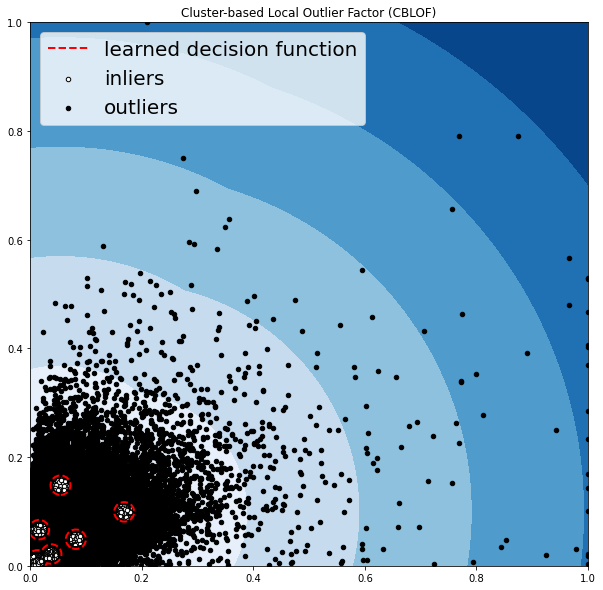

OUTLIERS :  85414 INLIERS :  1622923 Principal Component Analysis (PCA)


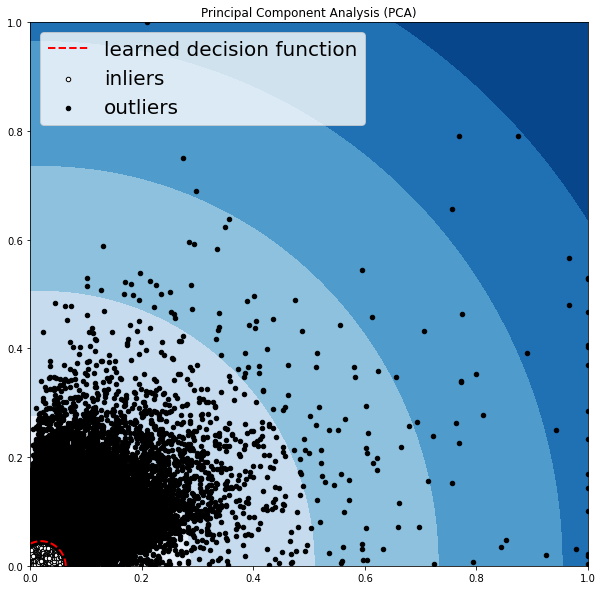

OUTLIERS :  85396 INLIERS :  1622941 Isolation Forest


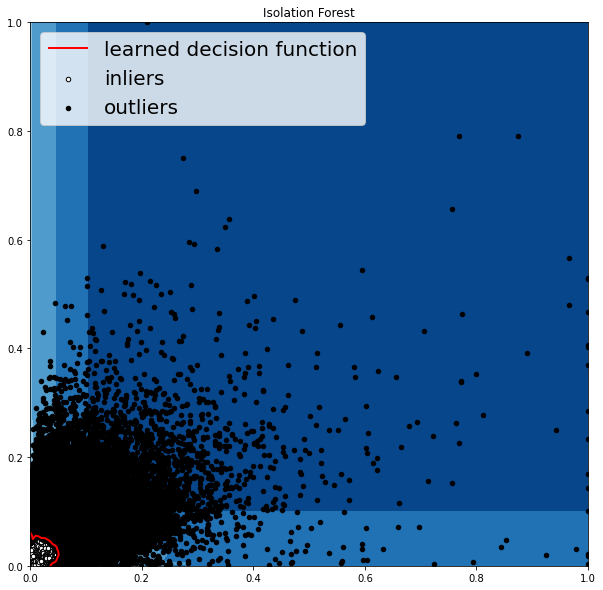

In [ ]:
import matplotlib
xx , yy = np.meshgrid(np.linspace(0,1, 200), np.linspace(0, 1, 200))
plt.figure(figsize=(16,8))
k= 0

for i, (clf_name, clf) in enumerate(classifiers.items()):
    clf.fit(X)
    
   # predict outlier score
    scores_pred = clf.decision_function(X) * -1
        
    # prediction of a datapoint category outlier or inlier
    y_pred = clf.predict(X)
    n_inliers = len(y_pred) - np.count_nonzero(y_pred)
    n_outliers = np.count_nonzero(y_pred == 1)
    plt.figure(figsize=(10, 10))
    
    # copy of dataframe
    dfx = X_std.copy()
    dfx['outlier'] = y_pred.tolist()
    X_std[clf_name]=y_pred.tolist()
    
    # IX1 - inlier feature 1,  IX2 - inlier feature 2
    IX1 =  np.array(dfx['totals.hits'][dfx['outlier'] == 0]).reshape(-1,1)
    IX2 =  np.array(dfx['totals.timeOnSite'][dfx['outlier'] == 0]).reshape(-1,1)
    
    # OX1 - outlier feature 1, OX2 - outlier feature 2
    OX1 =  np.array(dfx['totals.hits'][dfx['outlier'] == 1]).reshape(-1,1)
    OX2 =  np.array(dfx['totals.timeOnSite'][dfx['outlier'] == 1]).reshape(-1,1)
    
    print('OUTLIERS : ',n_outliers,'INLIERS : ',n_inliers, clf_name)
        
    # threshold value to consider a datapoint inlier or outlier
    threshold = stats.scoreatpercentile(scores_pred,100 * outliers_fraction)
        
    # decision function calculates the raw anomaly score for every point
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
    Z = Z.reshape(xx.shape)
          
    # fill blue map colormap from minimum anomaly score to threshold value
    plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
        
    # draw red contour line where anomaly score is equal to thresold
    a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
        
    # fill orange contour lines where range of anomaly score is from threshold to maximum anomaly score
    plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
        
    b = plt.scatter(IX1,IX2, c='white',s=20, edgecolor='k')
    
    c = plt.scatter(OX1,OX2, c='black',s=20, edgecolor='k')
       
    plt.axis('tight')  
    
    # loc=2 is used for the top left corner 
    plt.legend(
        [a.collections[0], b,c],
        ['learned decision function', 'inliers','outliers'],
        prop=matplotlib.font_manager.FontProperties(size=20),
        loc=2)
      
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.title(clf_name)
    plt.show()


In [ ]:
X_std.columns[-3:]

Index(['Cluster-based Local Outlier Factor (CBLOF)',
       'Principal Component Analysis (PCA)', 'Isolation Forest'],
      dtype='object')

In [ ]:
X_std['outlierpred']=X_std[['Cluster-based Local Outlier Factor (CBLOF)','Principal Component Analysis (PCA)', 'Isolation Forest']].mode(axis=1)
X_std.drop(['Cluster-based Local Outlier Factor (CBLOF)','Principal Component Analysis (PCA)', 'Isolation Forest'],axis=1,inplace=True)
X_std.columns

Index(['visitNumber', 'visitStartTime', 'totals.pageviews',
       'totals.sessionQualityDim', 'totals.transactions', 'weekday', 'day',
       'month', 'year', 'visitHour', 'totals.hits', 'totals.timeOnSite',
       'outlierpred'],
      dtype='object')

In [ ]:
#treating cols same as prior
df_cat = Xout.select_dtypes(include=[np.object])
from sklearn.preprocessing import LabelEncoder


categorical_feat = ['channelGrouping', 'device.browser', 'device.operatingSystem',
       'device.deviceCategory', 'geonetwork.continent',
       'geonetwork.subContinent', 'geonetwork.country', 'geonetwork.region',
       'geonetwork.metro', 'geonetwork.city', 'geonetwork.networkDomain',
       'trafficSource.campaign', 'trafficSource.source',
       'trafficSource.medium', 'trafficSource.keyword',
       'trafficSource.referralPath', 'trafficSource.adContent']
for feature in categorical_feat:
    
    label_encoder = LabelEncoder() # initializing        label encoder object
    
    label_encoder.fit(list(Xout[feature].values.astype('str')))
                                                             
# fit with list of variables in that feature
    
    df_cat[feature] = label_encoder.transform(list(Xout[feature].values.astype('str'))) 

    print("for this feature : {0} label-encoding was done succesfully".format(feature))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


for this feature : channelGrouping label-encoding was done succesfully
for this feature : device.browser label-encoding was done succesfully
for this feature : device.operatingSystem label-encoding was done succesfully
for this feature : device.deviceCategory label-encoding was done succesfully
for this feature : geonetwork.continent label-encoding was done succesfully
for this feature : geonetwork.subContinent label-encoding was done succesfully
for this feature : geonetwork.country label-encoding was done succesfully
for this feature : geonetwork.region label-encoding was done succesfully
for this feature : geonetwork.metro label-encoding was done succesfully
for this feature : geonetwork.city label-encoding was done succesfully
for this feature : geonetwork.networkDomain label-encoding was done succesfully
for this feature : trafficSource.campaign label-encoding was done succesfully
for this feature : trafficSource.source label-encoding was done succesfully
for this feature : traffi

In [ ]:
X_final_out = pd.concat([X_std, df_cat], axis=1)

X_final_out.head()

,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite,outlierpred,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,-0.142737,0.605943,-0.416481,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.000000,0.000000,0,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,0.391791,0.604581,-0.261990,0.010105,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,0.002004,0.001472,0,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,-0.142737,0.606138,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.002004,0.001998,0,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,-0.142737,0.604183,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,0.002004,0.000053,0,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,-0.142737,0.605457,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,0.002004,0.002734,0,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
a = X_final_out.index[X_final_out['outlierpred']==1]
X_final_out.drop(a,inplace=True)
X_final_out.head()

,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite,outlierpred,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent
0,-0.142737,0.605943,-0.416481,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.000000,0.000000,0,4,43,20,0,3,22,75,482,122,955,0,4,99,5,3365,3196,62
1,0.391791,0.604581,-0.261990,0.010105,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.659897,0.002004,0.001472,0,6,35,3,0,1,12,218,73,100,219,0,4,301,6,2853,300,62
2,-0.142737,0.606138,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,-1.806792,0.002004,0.001998,0,2,35,1,1,1,12,218,482,122,955,40939,4,0,0,2853,3196,62
3,-0.142737,0.604183,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,0.514798,0.002004,0.000053,0,4,35,20,0,2,21,210,482,122,955,38725,4,99,5,2853,3196,62
4,-0.142737,0.605457,-0.261990,-0.109881,-0.097997,-1.418165,0.037352,0.828311,0.081126,1.240295,0.002004,0.002734,0,4,35,20,0,1,3,132,482,122,955,29216,4,99,5,2853,3196,62


In [ ]:
X_final_out.shape

(1622477, 30)

In [ ]:
Tout=df_target.copy()
print (len(Tout))
Tout.drop(labels = a,inplace=True)
print (len(Tout))
X_final_out.drop(['outlierpred'],axis=1,inplace=True)

1708337
1622477


In [ ]:
print (len(ID))
ID.drop(labels = a,inplace=True)
print (len(ID))

1708337
1622477


In [ ]:
X_final_out['ID']=ID

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score,KFold,train_test_split

xtraino,xtesto,ytraino,ytesto=train_test_split(X_final_out,Tout,test_size=0.3,random_state=1)

In [ ]:
xtraino.shape ,xtesto.shape ,ytraino.shape ,ytesto.shape

((1135733, 30), (486744, 30), (1135733,), (486744,))

In [ ]:
# Creating dataframe with RFE selected variables using Random Forest estimator

xtrain_rfeo=xtraino[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

xtest_rfeo=xtesto[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]
X_final_rf_rfeo=X_final_out[['visitNumber','visitStartTime','totals.pageviews','totals.sessionQualityDim','totals.transactions','weekday','day','month',
                   'visitHour','totals.hits','totals.timeOnSite','channelGrouping','device.browser','device.operatingSystem','device.deviceCategory',
                   'geonetwork.region','geonetwork.metro','geonetwork.city','geonetwork.networkDomain','trafficSource.source']]

In [ ]:
#Random Forest model after removing outliers 
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(xtrain_rfeo, ytraino)
y_pred_rfeo=rf.predict(xtest_rfeo)
from sklearn.metrics import r2_score
r2_score(y_true = ytesto, y_pred = y_pred_rfeo)

0.9948006950401688

In [ ]:
# calculating training error for selected features
y_pred_traino= rf.predict(xtrain_rfeo)
mse_train= np.mean((ytraino- y_pred_traino)**2)
rmse_train = np.sqrt(mse_train)
print("Training error:",rmse_train)
# calculating test error for selected features
y_pred_testo= rf.predict(xtest_rfeo)
mse_test= np.mean((ytesto- y_pred_testo)**2)
rmse_test = np.sqrt(mse_test)
print("Test error:",rmse_test)
#validating the above model using K - cross validation for selected features
from sklearn.model_selection import cross_val_score
kfold= KFold(shuffle=True,n_splits=3,random_state=0)
mse= cross_val_score(rf,X_final_rf_rfeo,Tout,cv=kfold,scoring="neg_mean_squared_error")
rmse=np.sqrt(np.abs(mse))
print("Bias Error:",np.mean(rmse))
print("Variance Error :",np.std(rmse,ddof=1))

Training error: 0.031243308419337798
Test error: 0.08344398038843774
Bias Error: 0.0851864827196394
Variance Error : 0.0017816220294490201


In [ ]:
xtesto.shape

(486744, 30)

In [ ]:
xtesto['PredictedR'] = y_pred_testo
xtesto.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,visitNumber,visitStartTime,totals.pageviews,totals.sessionQualityDim,totals.transactions,weekday,day,month,year,visitHour,totals.hits,totals.timeOnSite,channelGrouping,device.browser,device.operatingSystem,device.deviceCategory,geonetwork.continent,geonetwork.subContinent,geonetwork.country,geonetwork.region,geonetwork.metro,geonetwork.city,geonetwork.networkDomain,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.referralPath,trafficSource.adContent,ID,PredictedR
1390962,-0.142737,1.342869,-0.416481,-0.109881,-0.097997,1.693174,-1.340060,-1.056700,1.566410,0.224599,0.000000,0.000000,4,72,23,1,2,21,216,482,122,955,38725,4,99,5,2853,3196,62,0890228750276340304,0.0
740280,0.284886,-1.069731,-0.261990,-0.229867,-0.097997,-1.418165,-1.225276,1.366886,-1.404158,1.095195,0.002004,0.000053,4,35,6,0,1,12,218,467,101,779,0,4,0,0,2853,3196,62,2658930008004335577,0.0
1628336,-0.035832,0.006042,-0.416481,-0.229867,-0.097997,1.693174,1.070412,-0.248838,0.081126,-1.226394,0.000000,0.000000,4,28,1,1,2,16,176,0,0,801,32968,4,0,0,2853,3196,62,1896539608846943985,0.0
1550181,-0.142737,1.627564,-0.416481,-0.109881,-0.097997,0.137504,1.185196,-0.787412,1.566410,-1.371493,0.000000,0.000000,7,28,1,1,0,17,182,482,122,955,36076,4,343,6,2853,2976,62,2388587663791875586,0.0
1487759,-0.142737,1.300819,-0.107499,-0.109881,-0.097997,1.174617,0.955627,-1.325987,1.566410,0.514798,0.004008,0.002314,4,35,1,1,2,16,94,194,0,380,38725,4,99,5,2853,3196,62,9129854846146096263,0.0


In [ ]:
xtesto.sort_values(by=['PredictedR'],ascending=False,inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
xtesto[['ID','PredictedR']].head(20)

,ID,PredictedR
810066,1957458976293878100,20.102389
1599740,1957458976293878100,19.052301
116925,7311242886083854158,19.029015
227177,2053497994005121330,19.001975
258317,39447420580864359,18.923024
1319186,3741029495705540856,18.856568
227287,2963465227561264930,18.793642
1599785,3724344539154169107,18.763809
922243,8930278305459563871,18.697706
518394,9938722218587002985,18.668079


In [ ]:
f = pd.DataFrame(xtesto[['ID','PredictedR']].groupby(by='ID').apply(np.sum))

In [ ]:
f.reset_index(drop=True,inplace=True)
f.sort_values(by=['PredictedR'],ascending=False,inplace=True)

In [ ]:
f.head(20)

,ID,PredictedR
337195,7813149961404844386781314996140484438678131499...,121.735782
314182,7311242886083854158731124288608385415873112428...,56.030317
85107,2338178303528914061233817830352891406123381783...,54.667436
291396,6820200829240883942682020082924088394268202008...,52.373519
106991,2811132188167803677281113218816780367728111321...,52.304598
72961,2074164338647079047207416433864707904720741643...,50.975730
67667,1957458976293878100195745897629387810019574589...,39.154690
206969,4984366501121503466498436650112150346649843665...,36.443519
111336,2904329822175970539290432982217597053929043298...,36.293345
337127,78117879346029426227811787934602942622,36.254414


In [ ]:
importance = rf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %s, Score: %.5f' % (xtest_rfeo.columns[i],v))

Feature: visitNumber, Score: 0.00046
Feature: visitStartTime, Score: 0.00132
Feature: totals.pageviews, Score: 0.00026
Feature: totals.sessionQualityDim, Score: 0.00018
Feature: totals.transactions, Score: 0.99393
Feature: weekday, Score: 0.00022
Feature: day, Score: 0.00049
Feature: month, Score: 0.00019
Feature: visitHour, Score: 0.00038
Feature: totals.hits, Score: 0.00036
Feature: totals.timeOnSite, Score: 0.00064
Feature: channelGrouping, Score: 0.00020
Feature: device.browser, Score: 0.00013
Feature: device.operatingSystem, Score: 0.00017
Feature: device.deviceCategory, Score: 0.00008
Feature: geonetwork.region, Score: 0.00028
Feature: geonetwork.metro, Score: 0.00017
Feature: geonetwork.city, Score: 0.00022
Feature: geonetwork.networkDomain, Score: 0.00024
Feature: trafficSource.source, Score: 0.00008


Text(0.5, 0, 'Permutation Importance')

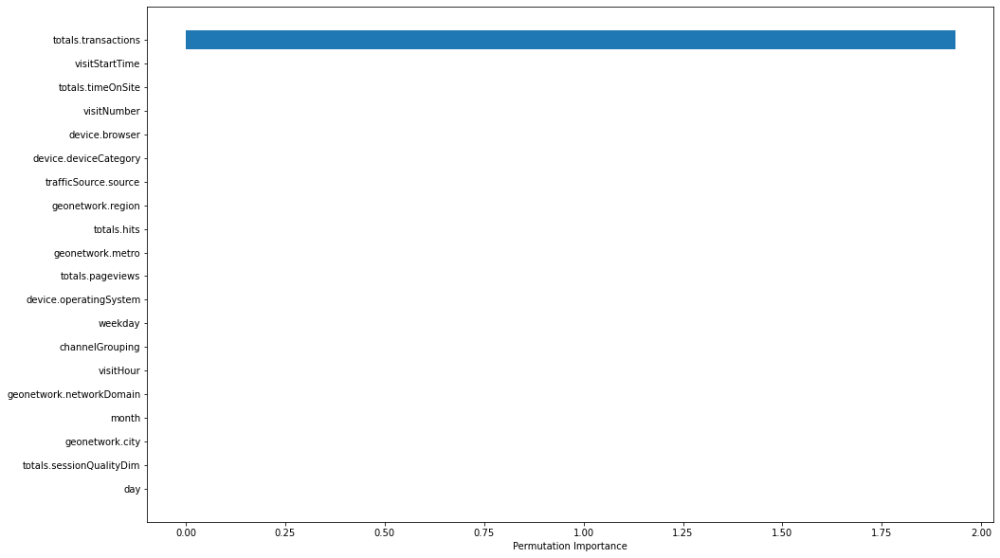

In [ ]:
# plot feature importance

#https://mljar.com/blog/feature-importance-in-random-forest/

from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(rf, xtest_rfeo, ytesto,random_state=0)
sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(16,10))
plt.barh(xtest_rfeo.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [ ]:
ss = sorted_idx[sorted_idx!=4]

Text(0.5, 0, 'Permutation Importance')

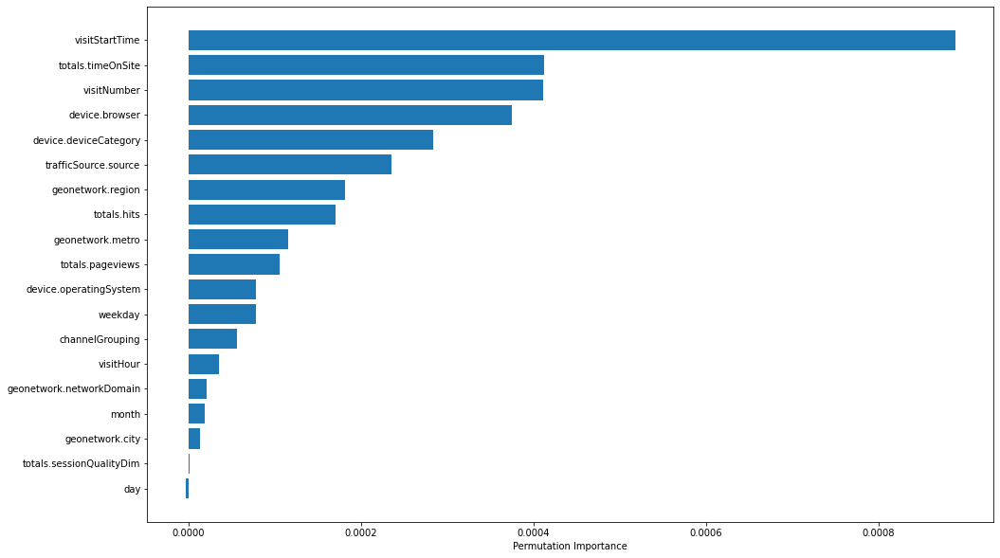

In [ ]:
#excluding totals.transactions
plt.figure(figsize=(16,10))
plt.barh(xtest_rfeo.columns[ss], perm_importance.importances_mean[ss])
plt.xlabel("Permutation Importance")

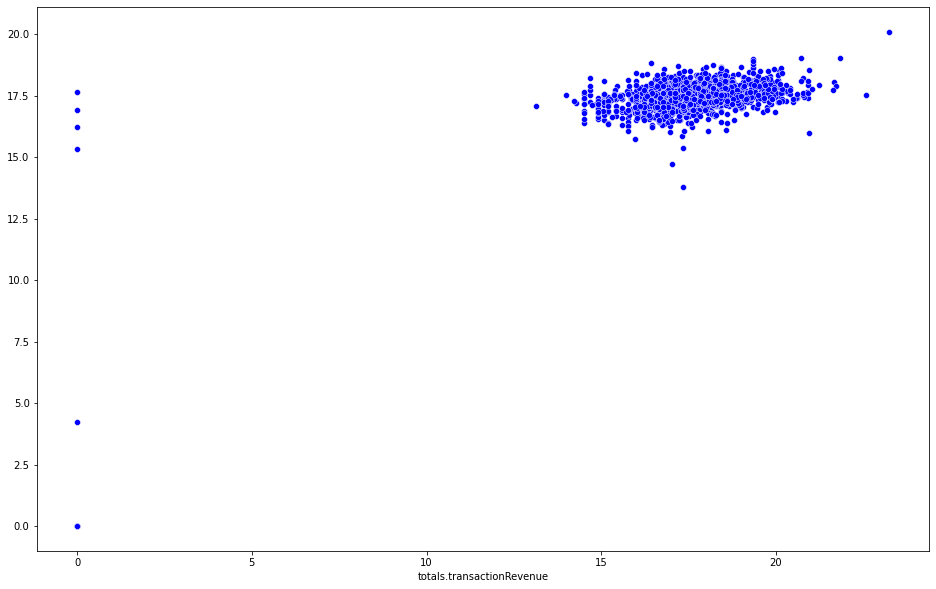

In [ ]:
import seaborn as sns
plt.figure(figsize=(16,10))
sns.scatterplot(x=ytesto, y=y_pred_testo, color="b")